בס"ד

ב"ה

# **The Golden Model**

Ben Besthof, Tal Benhamou, Daniel Malinsky

05/08/2024

DAV6150 Final Project

Yeshiva University

***Abstract***

Machine learning techniques can be used to hedge portfolio risk in times of economic recession by predicting the spot price of gold. Tree based regression methods can predict the price of gold per troy ounce within 5% of its actual value when trained with economic data, stock market indicators, and prices of commodities.
Exploring the set of factors will provide insight to which specific variables are necessary to understanding the variance precious metals pricing. Predictive modeling can also reveal feature predictability so to understand which variables influence the model's decisions.

# I. Introduction

There are over 170 currencies worldwide, and two of them have been traded over millennia: precious metals. Gold and silver are universally accepted forms of payment and fluctuate in value. According to Google, there are over 47,000 tonnes of gold bullion (coins and bars) in the world, valuing the gold bullion market at over $3 trillion. Several reasons exist why investors and bullion stackers favor gold over other assets, such as stable value, demand, and tangibility. Assuming that stackers and investors are motivated to buy gold at an optimal price, the next question that arises is under what conditions, or when, should one buy gold bullion?

The silver squeeze occurred in May 2021 when a group of Reddit investors caused the price of silver to spike. The motivation behind the artificial increase in the silver price was that silver is undervalued by banks. If Redditors overvalued silver while banks undervalued it, then what type of factors actually cause the prices of gold to move? Are such factors based on stock market performance? Based on comparison with commodity prices? Or is the price mainly influenced by inflation?


## 1. Research Questions

Gold and silver, as means of storing wealth independently of any country, have been subjects of price prediction attempts. This research aims to uncover the main factors explaining commodity price evolution and their impact. Understanding the relationship between gold prices and economic factors is vital for investors, financial institutions, policymakers, and individuals securing their wealth.

**Main Question: How accurately can the daily closing price of gold be predicted by contrasting the impact of inflation rates, commodity prices, and stock market fluctuations?**

<U>Secondary and tertiary research questions:</U>

1. Which of market conditions, inflation rates, and commodity prices has the most significant impact on the daily closing price of gold?

2. To what extent does inflation in a specific country exert a greater influence on the daily closing price of gold compared to other countries?

    
To answer these questions, we will focus on the period from 1990 to 2023, chosen due to its proximity to the end of the Cold War, marking the end of an era. We will use different datasets merged according to the date variable.

1. Consumer Price Index (CPI) dataset, providing monthly CPI for various countries (source: World Bank).

2. Commodity dataset, including monthly price variables such as crude oil, coal, natural gas, soft commodities, metals, and precious metals (source: The World Bank).

3. Daily closing price of gold in dollars from 1990 to 2023 (source: World Gold Council).

4. Daily datasets of Dow Jones Industrial Average (DJI), NASDAQ Composite Index, and S&P 500 Index (source: Yahoo Finance).

## 2. Data to be used

Our target variable is the daily closing price of gold. The data will be collected from various sources:

1. Consumer Price Index (CPI) data will be obtained from the World Bank.

2. Commodity prices dataset will be sourced from The World Bank.

3. Daily gold price data will be collected from the World Gold Council.

4. Dow Jones Industrial Average (DJI) data will be extracted from Yahoo Finance.

5. NASDAQ Composite Index data will be sourced from Yahoo Finance.

6. S&P 500 Index data will also be obtained from Yahoo Finance.


In [186]:
import pandas as pd

In [187]:
# CPI dataset:
url = 'https://raw.githubusercontent.com/Benhamax/DAV-6150---Data-Science/main/Final%20project%20data/cpi_data.csv'

cpi_df = pd.read_csv(url)
cpi_df.head()

,Month,USA_CPI,AUT_CPI,CAN_CPI,SA_CPI,UK_CPI,SUI_CPI,FRA_CPI,GER_CPI,IL_CPI,ITA_CPI,PRC_CPI,RUS_CPI
0,197001,15.9,22.5,16.0,1.7,8.1,33.4,14.3,29.2918,0.0,5.5,0.0,0.0
1,197002,16.0,22.5,16.0,1.7,8.2,33.4,14.4,29.3570,0.0,5.6,0.0,0.0
2,197003,16.1,22.5,16.0,1.7,8.2,33.4,14.4,29.4875,0.0,5.6,0.0,0.0
3,197004,16.2,22.5,16.0,1.8,8.3,33.4,14.5,29.6180,0.0,5.6,0.0,0.0
4,197005,16.3,22.6,16.0,1.8,8.4,33.7,14.5,29.6180,0.0,5.7,0.0,0.0


In [188]:
# commodity dataset:
url = 'https://raw.githubusercontent.com/Benhamax/DAV-6150---Data-Science/main/Final%20project%20data/commodity_prices.csv'

# Specify the encoding parameter
commodity_df = pd.read_csv(url, encoding='latin1')

commodity_df.head()

,MONTH,CRUDE_PETRO,CRUDE_BRENT,CRUDE_DUBAI,CRUDE_WTI,COAL_AUS,COAL_SAFRICA,NGAS_US,NGAS_EUR,NGAS_JP,...,ALUMINUM,IRON_ORE,COPPER,LEAD,Tin,NICKEL,Zinc,GOLD,PLATINUM,SILVER
0,1960M01,1.63,1.63,1.63,,,,0.14,0.404774,,...,511.471832,11.42,715.40,206.1,2180.4,1631.0,260.8,35.27,83.5,0.9137
1,1960M02,1.63,1.63,1.63,,,,0.14,0.404774,,...,511.471832,11.42,728.19,203.7,2180.4,1631.0,244.9,35.27,83.5,0.9137
2,1960M03,1.63,1.63,1.63,,,,0.14,0.404774,,...,511.471832,11.42,684.94,210.3,2173.8,1631.0,248.7,35.27,83.5,0.9137
3,1960M04,1.63,1.63,1.63,,,,0.14,0.404774,,...,511.471832,11.42,723.11,213.6,2178.2,1631.0,254.6,35.27,83.5,0.9137
4,1960M05,1.63,1.63,1.63,,,,0.14,0.404774,,...,511.471832,11.42,684.75,213.4,2162.7,1631.0,253.8,35.27,83.5,0.9137


In [189]:
# goldprice dataset:

url = 'https://raw.githubusercontent.com/Benhamax/DAV-6150---Data-Science/main/Final%20project%20data/goldprices.csv'

gold_df = pd.read_csv(url)
gold_df.head()

,DATE,USD
0,1/1/1990,398.6
1,1/2/1990,399
2,1/3/1990,395
3,1/4/1990,396.5
4,1/5/1990,405


In [190]:
# dowjones dataset:

url = 'https://raw.githubusercontent.com/Benhamax/DAV-6150---Data-Science/main/Final%20project%20data/%5EDJI_historical_data.csv'
dji_df = pd.read_csv(url)
dji_df.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,1992-01-02,3152.100098,3172.629883,3139.310059,3172.399902,3172.399902,23550000
1,1992-01-03,3172.399902,3210.639893,3165.919922,3201.500000,3201.500000,23620000
2,1992-01-06,3201.500000,3213.330078,3191.860107,3200.100098,3200.100098,27280000
3,1992-01-07,3200.100098,3210.199951,3184.479980,3204.800049,3204.800049,25510000
4,1992-01-08,3204.800049,3229.199951,3185.820068,3203.899902,3203.899902,29040000


In [191]:
# SP500 dataset:

url = 'https://raw.githubusercontent.com/Benhamax/DAV-6150---Data-Science/main/Final%20project%20data/%5EGSPC_historical_data.csv'

sp500_df = pd.read_csv(url)
sp500_df.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,1990-01-02,353.399994,359.690002,351.980011,359.690002,359.690002,162070000
1,1990-01-03,359.690002,360.589996,357.890015,358.760010,358.760010,192330000
2,1990-01-04,358.760010,358.760010,352.890015,355.670013,355.670013,177000000
3,1990-01-05,355.670013,355.670013,351.350006,352.200012,352.200012,158530000
4,1990-01-08,352.200012,354.239990,350.540009,353.790009,353.790009,140110000


In [192]:
# Nasdaq dataset:

url = 'https://raw.githubusercontent.com/Benhamax/DAV-6150---Data-Science/main/Final%20project%20data/%5EIXIC_historical_data.csv'

nasdaq_df = pd.read_csv(url)
nasdaq_df.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,1990-01-02,452.899994,459.299988,452.700012,459.299988,459.299988,110720000
1,1990-01-03,461.100006,461.600006,460.000000,460.899994,460.899994,152660000
2,1990-01-04,460.399994,460.799988,456.899994,459.399994,459.399994,147950000
3,1990-01-05,457.899994,459.399994,457.799988,458.200012,458.200012,137230000
4,1990-01-08,457.100006,458.700012,456.500000,458.700012,458.700012,115500000


## 3. Approach

Our analysis will not utilize a time series model, as we will not study the impact of time on the target variable with other things equal.

We plan to adopt a common data splitting approach, specifically a 70-30 split. This entails allocating 70% of the data for training the model, leaving the remaining 30% for testing. By doing so, we aim to train the model on a significant portion of the data and subsequently evaluate its performance on unseen examples, ensuring robust generalization to new data.

We considered adding other golobal events to the set but these are reflected in commodities prices and economic factors so we won't.

**Assumptions for Choosing Research Questions:**

The choice of these research questions is based on the assumption that gold prices are influenced by a combination of economic factors, including inflation rates, commodity prices, and stock market fluctuations. The historical significance of gold and its role as a store of value, independent of national currencies, suggests a complex interplay between these variables. By investigating these relationships, the research aims to contribute to a deeper understanding of the factors driving gold prices.

**Similar Analyses by Other Researchers:**

While various researchers have explored the factors influencing gold prices, specific analyses combining inflation rates, commodity prices, and stock market fluctuations may be limited. Researchers such as R.Aggarwal, and L.A. Soenen. have investigated individual aspects of market factors, but a comprehensive examination of their collective impact on gold prices is less common. The research aims to fill this gap by providing a holistic view of the influences on gold prices.

**Approach of Other Researchers:**

Research by Ratner, M., and S. Klein. typically focused on the oil and gas, basic materials, industrials and technology industry" and its impact on gold prices. Their methodologies may include statistical models, time series analyses, or econometric approaches. However, a thorough examination of existing literature will be conducted to identify any comprehensive analyses similar to the current research focus.

**Action: Further Discussion - What Exactly Are We Predicting?**

In this analysis, we aim to predict the daily closing price of gold. The daily closing price serves as a key metric reflecting the market's valuation of gold at the end of each trading day. By understanding the factors that contribute to these price fluctuations, we can offer insights into potential patterns, trends, and influences on gold prices. This information is valuable for investors, financial institutions, and policymakers seeking to make informed decisions related to gold as a financial asset.

To manage the collected data, we plan to utilize Python programming language and local storage solutions. We will store the data in structured formats like CSV files, ensuring easy access and manipulation using Python libraries such as Pandas. Data preprocessing steps will involve cleaning and transforming the data within Python environment to maintain flexibility and control over the process. For statistical analysis, we will leverage Python libraries such as NumPy, SciPy, and StatsModels to conduct correlation analysis, regression analysis, and time series analysis. Visualizations will be generated using Matplotlib and Seaborn libraries to create various plots like scatter plots, line charts, and heatmaps for result interpretation. In terms of modeling, we intend to implement three different types of models within Python, including linear regression, decision trees, and neural networks, using libraries like Scikit-learn and TensorFlow. We will compare the performance of these models based on relevant metrics such as accuracy and error rates. Finally, for ensemble modeling, we will explore techniques available in Python libraries like Scikit-learn, such as ensemble methods and stacking, to combine the predictions of individual models for improved accuracy. This approach ensures that our project remains realistic and feasible within the local Python environment and allotted time frame.

We have yet to finalize our individual responsibilities; however, we intend for Ben to focus on feature selection, Daniel to handle modeling, and Tal to evaluate the models' performance and potentially work on improvements. We will all contribute equally to completing the exploratory data analysis (EDA) as it will be beneficial for all group members to thoroughly understand the data.


# II. Exploratory Data Analysis (EDA)

To begin the explanatory data analysis, we analyse each dataset one by one. We will merge the dataset together after the EDA.

For everydata set, we started by following the normal step^s of EDA and then we've done a feature selection or feature creation if needed.

## 1. Commodities dataset (commodity_df)

Commodities are widely used natural resources that humans expend to produce things. For example, coal is burned to produce energy, crude oil is refined and used to produce energy.
Precious metals (gold, silver, platinum) are also traded in the commodities market. Gold, silver, and platnimum contain properties useful for the function of products like semiconductors in addition to its natural value. In fact, a standard Tesla Model 3 can contain anywhere between 0.8-1.6 oz of silver in its batteries and semiconductors according to the Silver Institute. The availability and price of these products reflect the price at specific levels of supply and demand for them.

**It is fair to assume that there is an underlying relationship that exists between the prices of the commodidies. This assumption will be verified through exploratoring historical prices of commodies available through the World Bank website.**


**Note**

 This is not the final dataset that is used to train the model because 761 rows is not enough data for more complex models to make predictions on. It is being used for feature selection so that more data can be found on set of features that are believed to best optimize predictive model complexity.

In [193]:
#install required packages
!pip install statsmodels
!pip install regex
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import regex as re
from datetime import datetime
import scipy as sp
import statsmodels.api as sm
df = pd.read_csv('https://raw.githubusercontent.com/Benhamax/final-project/main/com_prices.csv')
df.head()

,MONTH,CRUDE_PETRO,CRUDE_BRENT,CRUDE_DUBAI,CRUDE_WTI,COAL_AUS,COAL_SAFRICA,NGAS_US,NGAS_EUR,NGAS_JP,...,ALUMINUM,IRON_ORE,COPPER,LEAD,Tin,NICKEL,Zinc,GOLD,PLATINUM,SILVER
0,1960M01,1.63,1.63,1.63,…,…,…,0.14,0.404774,…,...,511.471832,11.42,715.40,206.1,2180.4,1631.0,260.8,35.27,83.5,0.9137
1,1960M02,1.63,1.63,1.63,…,…,…,0.14,0.404774,…,...,511.471832,11.42,728.19,203.7,2180.4,1631.0,244.9,35.27,83.5,0.9137
2,1960M03,1.63,1.63,1.63,…,…,…,0.14,0.404774,…,...,511.471832,11.42,684.94,210.3,2173.8,1631.0,248.7,35.27,83.5,0.9137
3,1960M04,1.63,1.63,1.63,…,…,…,0.14,0.404774,…,...,511.471832,11.42,723.11,213.6,2178.2,1631.0,254.6,35.27,83.5,0.9137
4,1960M05,1.63,1.63,1.63,…,…,…,0.14,0.404774,…,...,511.471832,11.42,684.75,213.4,2162.7,1631.0,253.8,35.27,83.5,0.9137


The data contains the monthly prices of over 70 commodities since 1960.

Additionally, it is important to note that the scales across commodities are different. The price of gold indicated in the data is per ounce, but the price of crude oil is the dollar value per barrel.

The 72 different products will be divided into groups by relevance for analytical purposes.

For example, the price per barrel of oil (refined in the USA) 'CRUDE_WTI' will be analyzed with the price of natural gas (refined in the USA) 'NGAS_USA' because both are energy-related commodities. This approach best organizes the analysis in an interpretable way.

The objective of the analysis is to extract insights from commodities prices that will optimize the complexity of models to best predict the spot price of gold.

| Variable Name                  | Description                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                      |
|--------------------------------|----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------|
| Energy                         |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                  |
| **Coal (Australia)**              | From February 2022, port thermal, f.o.b. Newcastle, 6000 kcal/kg futures price. From 2015 to January 2022, port thermal, f.o.b. Newcastle, 6000 kcal/kg spot price. 2002-2014, thermal GAR, f.o.b. piers, Newcastle/Port Kembla, 6,300 kcal/kg (11,340 btu/lb), less than 0.8% sulfur 13% ash; previously 6,667 kcal/kg (12,000 btu/lb), less than 1.0% sulfur, 14% ash |
| **Coal (Colombia)**              | From August 2005 onwards, thermal GAR, f.o.b. Bolivar, 6,450 kcal/kg (11,200 btu/lb), less than 1.0% sulfur, 16% ash. During years 2002-July 2005, 11,600 btu/lb, less than .8% sulfur, 9% ash, 180 days forward delivery.                                                         |
| **Coal (South Africa)**          | From January 2015, f.o.b. Richards Bay, NAR, 6,000 kcal/kg, sulfur less than 1%, forward month 1. From February 13, 2017 to December 2017, thermal NAR netback assessment f.o.b. Richards Bay 6,000 kcal/kg. During 2006-February 10, 2017, thermal NAR. During 2002-2005, 6,200 kcal/kg (11,200 btu/lb), less than 1.0%, sulfur 16% ash. Years 1990-2001, 6390 kcal/kg (11,500 btu/lb).                                                                                                                                                                                                                                                                                                                                                                                                      |
| **Crude oil**                    | Average spot price of Brent, Dubai, and West Texas Intermediate, equally weighed.                                                                                                                                                                                       |
| **Crude oil, UK**                | Brent 38° API.                                                                                                                                                                                             |
| **Crude oil, Dubai**             | Fateh 32° API for years 1985-present; 1960-84 refer to Saudi Arabian Light, 34° API.                                                                                                                                                                                   |
| **Crude oil, US**                | West Texas Intermediate (WTI) 40° API.                                                                                                                                                                    |
| **Natural gas index (Laspeyres)** | Average of Europe, US, and Japan (LNG), weights based on 5-year average consumption volumes, updated every 5 years, except the 11-year period 1960-70.                                                                                                             |
| **Natural Gas (Europe)**         | From April 2015, Netherlands Title Transfer Facility (TTF). April 2010 to March 2015, average import border price and a spot price component, including UK. During June 2000 - March 2010, prices exclude UK.                                                                 |
| **Natural Gas (U.S.)**           | Spot price at Henry Hub, Louisiana.                                                                                                                                                                        |
| **Liquefied natural gas (Japan)** | LNG, import price, cif; recent two months' averages are estimates.                                                                                                                                          |
| **Beverages**                  |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                   |
| **Cocoa (ICCO)**               | International Cocoa Organization daily price: average of the first three positions on the terminal markets of New York and London, nearest three future trading months.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                         |
| **Coffee, Arabica (ICO)**     | International Coffee Organization indicator price, other mild Arabicas, average New York and Bremen/Hamburg markets, ex-dock.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                   |
| **Coffee, Robusta (ICO)**     | International Coffee Organization indicator price, Robustas, average New York and Le Havre/Marseilles markets, ex-dock.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                       |
| **Tea, average three auctions** | Arithmetic average of quotations at Kolkata, Colombo, and Mombasa/Nairobi.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                      |
| **Tea (Colombo auctions)**    | Sri Lankan origin, all tea, arithmetic average of weekly quotes.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                 |
| **Tea (Kolkata auctions)**    | Leaf, include excise duty, arithmetic average of weekly quotes.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                  |
| **Tea (Mombasa/Nairobi auctions)** | African origin, all tea, arithmetic average of weekly quotes.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                   |
| **Oils/Meals**                |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                   |
| **Coconut oil**               | (Philippines/Indonesia), from January 2021, crude, CIF Rotterdam; January 1999 to December 2020, crude, CIF NW Europe; previously, bulk, c.i.f. Rotterdam.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                  |
| **Copra**                     | (Philippines/Indonesia), bulk, c.i.f. N.W. Europe.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                              |
| **Fishmeal**                  | From January 2021, German Fishmeal, Danish 64% Pro, FOB Bremen; January 1999 to December 2020, German, 64% protein, EXW Hamburg.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                             |
| **Groundnuts (U.S.)**         | Runners 40/50, CFR N.W. Europe. Europe beginning January 1999; previously (US), Runners 40/50 shelled basis, c.i.f. Rotterdam.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                              |
| **Groundnut oil**             | Refined, FOR Ports India, beginning January 2023; December 2020-2022, Dutch Refined GroundNut Oil A/O, Ex Tank Rotterdam; January 1999-November 2020, U.S. crude, FOB South-East; previously any origin, c.i.f. Rotterdam.                                                                                                                                                                                                                                                                                                                                                                                                                                                   |
| **Palm oil (Malaysia)**       | From January 2021, RBD, FOB Malaysia Ports; December 2001 to December 2020, RBD, CIF Rotterdam; previously Malaysia 5%, c.i.f. N.W. Europe, bulk, nearest forward.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                         |
| **Palmkernel oil (Malaysia/Indonesia)** | From January 2021, crude CIF Rotterdam; August 2001 to December 2020, crude, CIF NW Europe; previously Malaysian, nearest forward.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                           |
| **Soybean meal**              | From January 2021, Soybean Pellets 48% Pro, Brazil, CIF Rotterdam; January 1999 to December 2020, Brazilian pellets 48% protein, CIF Rotterdam; during 1990 - 1998, 45/46% c.i.f. Rotterdam, nearest forward; previously US origin 44%.                                                                                                                                                                                                                                                                                                                                                                                                                                      |
| **Soybean oil**               | From January 2021, Dutch Soyoil Crude Degummed, EXW Dutch Mills; January 1999 to December 2020, Dutch crude degummed, FOB NW Europe; previously crude, f.o.b. ex-mill Netherlands, nearest forward.                                                                                                                                                                                                                                                                                                                                                                                                                                                                     |
| **Soybeans**                  | From January 2021, U.S Gulf Yellow Soybean #2, CIF Rotterdam; December 2007 to December 2020, U.S. No. 2 yellow meal, CIF Rotterdam; previously US origin, nearest forward.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                              |
| **Sunflower oil**             | From September 2020, Dutch Sunseed Oil, f.o.b. Rotterdam; February 2011 to August 2020, European crude, f.o.b. Rotterdam; previously, EU f.o.b NW Europe ports.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                            |
| **Grains**                     |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                   |
| **Barley (U.S.)**             | Feed, No. 2, spot, 20 days To-Arrive, delivered Minneapolis from May 2012 onwards; during 1980 - 2012 April Canadian, feed, Western No. 1, Winnipeg Commodity Exchange, spot, wholesale farmers' price.                                                                                                                                                                                                                                                                                                                                                                                                                                                                 |
| **Maize (U.S.)**              | No. 2, yellow, f.o.b. US Gulf ports.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                             |
| **Rice (Thailand)**           | 5% broken, white rice (WR), milled, indicative price based on weekly surveys of export transactions, government standard, f.o.b. Bangkok.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                  |
| **Rice (Thailand)**           | 25% broken, WR, milled indicative survey price, government standard, f.o.b. Bangkok.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                           |
| **Rice (Thailand)**           | 100% broken, A.1 Super from 2006 onwards, government standard, f.o.b. Bangkok; prior to 2006, A1 Special, a slightly lower grade than A1 Super.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                             |
| **Rice (Vietnam)**            | 5% broken, WR, milled, weekly indicative survey price, Minimum Export Price, f.o.b. Hanoi.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    |
| **Sorghum (US)**              | No. 2 milo yellow, Texas export bids for grain delivered to export elevators, rail-truck, f.o.b. Gulf ports.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    |
| **Wheat (Canada)**            | No. 1, Western Red Spring (CWRS), in store, St. Lawrence, export price.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                          |
| **Wheat (U.S.)**              | No. 2 hard red winter Gulf export price; June 2020 backwards, No. 1, hard red winter, ordinary protein, export price delivered at the US Gulf port for prompt or 30 days shipment.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                        |
| **Wheat (U.S.)**              | No. 2, soft red winter, export price delivered at the US Gulf port for prompt or 30 days shipment.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                              |
| **Food**                       |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                   |
| **Bananas (Central & South America)** | Major brands, free on truck (f.o.t.) Southern Europe, including duties; prior to October 2006, f.o.t. Hamburg.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                |
| **Bananas (Central & South America)** | Major brands, US import price, free on truck (f.o.t.) US Gulf ports.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                            |
| **Meat, beef (Australia/New Zealand)** | Mixed trimmings 85%, East Coast, 7-45 day deferred delivery, FOB port of entry, beginning January 1995; previously cow forequarters.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                       |
| **Chicken (U.S.)**            | Urner Barry North East weighted average for broiler/fryer, whole birds, 2.5 to 3.5 pounds, USDA grade "A" from 2013 onwards; 1980-2012, Georgia Dock weighted average, 2.5 to 3 pounds, wholesale; previously World Bank estimates.                                                                                                                                                                                                                                                                                                                                                                                                                                            |
| **Lamb (U.S.)**                | Boxed lamb cuts, leg, double, trotter-on, less than truckload (LTL) pricing, from August 2010; previously, (New Zealand) frozen whole carcasses Prime Medium (PM) wholesale, Smithfield, London beginning January 2006; previously Prime Light (PL).                                                                                                                                                                                                                                                                                                                                                                                                                            |
| **Oranges (Mediterranean exporters)** | Navel, European Union indicative import price, c.i.f. Paris.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    |
| **Shrimp, (U.S.)**            | Brown, shell-on, headless, in frozen blocks, source Gulf of Mexico, 26 to 30 count per pound, wholesale US beginning 2004; previously New York.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               |
| **Sugar (EU)**                 | European Union negotiated import price for raw unpackaged sugar from African, Caribbean, and Pacific (ACP) under Lome Conventions, c.I.f. European ports.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                       |
| **Sugar (U.S.)**               | Nearby futures contract, c.i.f.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                 |
| **Sugar (World)**              | International Sugar Agreement (ISA) daily price, raw, f.o.b. and stowed at greater Caribbean ports.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                             |
| **Timber**                     |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                   |
| **Logs (Africa)**              | Sapele, high quality (loyal and marchand), 80 centimeter or more, f.o.b. Douala, Cameroon beginning January 1996; previously of unspecified dimension.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    |
| **Logs (Southeast Asia)**     | Meranti, Sarawak, sale price charged by importers, Tokyo beginning February 1993; previously average of Sabah and Sarawak weighted by Japanese import volumes.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                             |
| **Plywood (Africa and Southeast Asia)** | Lauan, 3-ply, extra, 91 cm x 182 cm x 4 mm, wholesale price, spot Tokyo.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                         |
| **Sawnwood (Africa)**         | Sapele, width 6 inches or more, length 6 feet or more, f.a.s. Cameroonian ports.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                |
| **Sawnwood (Southeast Asia)** | Dark red seraya/meranti, select and better quality, average 7 to 8 inches; length average 12 to 14 inches; thickness 1 to 2 inch(es); kiln dry, c. & f. UK ports, with 5% agents commission including premium for products of certified sustainable forest beginning January 2005; previously excluding the premium.                                                                                                                                                                                                                                                                                                                                                      |
| **Woodpulp (Sweden)**         | Softwood, sulphate, bleached, air-dry weight, c.i.f. North Sea ports.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                            |
| **Raw Materials**              |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                   |
| **Cotton (Cotton Outlook "CotlookA index")** | Middling 1-3/32 inch, traded in Far East, C/F beginning 2006; previously Northern Europe, c.i.f.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                |
| **Cotton (US)**               | Memphis/Eastern, middling 1-3/32 inch, Far East, C/F beginning October 2008; previously c.i.f. Northern Europe.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               |
| **Rubber (Asia), RSS3 grade** | Singapore Commodity Exchange Ltd (SICOM) nearby contract beginning 2004; during 2000 to 2003, Singapore RSS1; previously Malaysia RSS1.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                       |
| **Rubber (Asia), TSR 20**     | Technically Specified Rubber, SGX/SICOM nearby futures contract.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                 |
| **Tobacco (any origin)**      | Unmanufactured, general import, cif, US.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                       |
| **Fertilizer**                 |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                   |
| **DAP**                        | (Diammonium phosphate), spot, f.o.b. US Gulf.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                   |
| **Phosphate rock**             | F.o.b. North Africa.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                             |
| **Potassium chloride**         | (Muriate of potash), Brazil CFR granular spot price from January 2020; previously, f.o.b. Vancouver.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                           |
| **TSP (triple superphosphate)** | Spot, import US Gulf.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                            |
| **Urea, (Ukraine)**           | Prill spot f.o.b. Middle East, beginning March 2022; previously, f.o.b. Black Sea.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                             |
| **Metals and Minerals**        |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                   |
| **Aluminum (LME)**             | London Metal Exchange, unalloyed primary ingots, high grade, minimum 99.7% purity, settlement price beginning 2005; previously cash price.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                     |
| **Copper (LME)**               | Grade A, minimum 99.9935% purity, cathodes and wire bar shapes, settlement price.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                              |
| **Iron ore**                   | Spot in US dollar/dry ton and contract in US cents/dmtu. For years 2008 (December) to present, spot, (any origin) fines, 62% Fe, c.f.r. China; during 2006 to 2008 (November) spot, 63.5%Fe. Earlier data refer to annual contract prices (Brazil for Europe,) VALE Carajas mines sinter feed, f.o.b. Ponta da Madeira during years 1987-2009; Itabira mines f.o.b. Tubarão for years 1960-86. Unit dmtu denotes dry metric ton unit, i.e. 1% Fe-unit. |
| **Iron ore (any origin)**      | Fines, spot price, c.f.r. China, 62% Fe beginning December 2008; previously 63.5%.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                             |
| **Lead (LME)**                 | Refined, 99.97% purity, settlement price                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                           |
| **Nickel (LME)**               | High grade, minimum 99.8% purity, settlement price beginning 2005; previously cash buyer.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                      |
| **Steel products index**              |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                   |
| **Steel, Cold-rolled coil/sheet (Japan)**  | Producers' export contracts (3 to 12 months terms) fob mainly to Asia.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                         |
| **Steel, Hot-rolled coil/sheet (Japan)**   | Producers' export contracts (3 to 12 months terms) fob mainly to Asia.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                         |
| **Steel, Rebar (concrete Reinforcing bars)** | Producers' export contracts (3 to 12 months terms) fob mainly to Asia.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                         |
| **Steel, Wire rod (Japan)**                | Producers' export contracts (3 to 12 months terms) fob mainly to Asia.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                         |
| **Tin (LME)**                              | Refined, 99.85% purity, settlement price.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                     |
| **Zinc (LME)**                             | High grade, minimum 99.95% purity, settlement price beginning April 1990; previously special high grade, minimum 99.995%, cash prices.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                       |
| **Precious Metals**              |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                   |
| **Gold (UK)**                              | 99.5% fine, London afternoon fixing, average of daily rates.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                  |
| **Platinum (UK)**                          | 99.9% refined, London afternoon fixing.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                      |
| **Silver (UK)**                            | 99.9% refined, London afternoon fixing; prior to July 1976 Handy & Harman. Grade prior to 1962 unrefined silver.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               |

Note that the prices for precious metals are in Pound Sterling. The final dataset cotaining the prices of the precious will be in US Dollars.

    As of 4/28/2024:

        $1.00 = £0.79

### Data Cleaning

There is reformating and imputation needed for missing values in the data.

In [194]:
df.head()

,MONTH,CRUDE_PETRO,CRUDE_BRENT,CRUDE_DUBAI,CRUDE_WTI,COAL_AUS,COAL_SAFRICA,NGAS_US,NGAS_EUR,NGAS_JP,...,ALUMINUM,IRON_ORE,COPPER,LEAD,Tin,NICKEL,Zinc,GOLD,PLATINUM,SILVER
0,1960M01,1.63,1.63,1.63,…,…,…,0.14,0.404774,…,...,511.471832,11.42,715.40,206.1,2180.4,1631.0,260.8,35.27,83.5,0.9137
1,1960M02,1.63,1.63,1.63,…,…,…,0.14,0.404774,…,...,511.471832,11.42,728.19,203.7,2180.4,1631.0,244.9,35.27,83.5,0.9137
2,1960M03,1.63,1.63,1.63,…,…,…,0.14,0.404774,…,...,511.471832,11.42,684.94,210.3,2173.8,1631.0,248.7,35.27,83.5,0.9137
3,1960M04,1.63,1.63,1.63,…,…,…,0.14,0.404774,…,...,511.471832,11.42,723.11,213.6,2178.2,1631.0,254.6,35.27,83.5,0.9137
4,1960M05,1.63,1.63,1.63,…,…,…,0.14,0.404774,…,...,511.471832,11.42,684.75,213.4,2162.7,1631.0,253.8,35.27,83.5,0.9137


- The month column needs to be fixed so that it is in month-year format.

- Null values need to be imputed with 0.0.

Reasons to impute null values with 0.0:

- CRUDE WTI was not traded back in the 1960s.
    
- Japan did not manufacture natural gas back in 1960.
        
- Data types need to be changed from object to float since several of the commodities prices are strings.

    Example: '---' should be 0.0

In [195]:
#checking the data types, shape, and nulls with Pandas info function
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 761 entries, 0 to 760
Data columns (total 72 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MONTH          761 non-null    object 
 1   CRUDE_PETRO    761 non-null    float64
 2   CRUDE_BRENT    761 non-null    float64
 3   CRUDE_DUBAI    761 non-null    float64
 4   CRUDE_WTI      761 non-null    object 
 5   COAL_AUS       761 non-null    object 
 6   COAL_SAFRICA   761 non-null    object 
 7   NGAS_US        761 non-null    float64
 8   NGAS_EUR       761 non-null    float64
 9   NGAS_JP        761 non-null    object 
 10  iNATGAS        761 non-null    object 
 11  COCOA          761 non-null    float64
 12  COFFEE_ARABIC  761 non-null    float64
 13  COFFEE_ROBUS   761 non-null    float64
 14  TEA_AVG        761 non-null    float64
 15  TEA_COLOMBO    761 non-null    float64
 16  TEA_KOLKATA    761 non-null    float64
 17  TEA_MOMBASA    761 non-null    float64
 18  COCONUT_OI

CRUDE_WTI and COAL_AUS are examples of objects that need to be converted to floats.
These variables are read as objects because they are the ones that contain missing values. Pandas does not indicate missing values because the value used to represent null values equals '...'.


### DataType conversion

In [196]:
#create function that converts object to float.

def to_float(df):
    """ Fucntion that converts objects to floats using Pandas, inputes for null values, reformats data to MM/YY format.

    Args:
        df (dataframe): dataframe to be reformatted

    Returns:
        df (dataframe): reformatted dataframe

    """
    for i in df.columns:
        if i != 'MONTH':
            df[i] = df[i].replace('...', np.nan)
    for i in df.columns:
        if i != 'MONTH':
            df[i] = pd.to_numeric(df[i], errors='coerce')
    df.fillna(0.0, inplace = True)

    #use regex to tranform month column to month/year format


    def monthyear(column):
        """ Function that reformats month column to month/year format using RegEx.

        Args:
            column (str): column to be reformatted
        """
        return re.sub(r'(\d{4})M(\d{2})', r'\2/\1', column)

    df['MONTH'] = df['MONTH'].apply(monthyear)
    df['MONTH'] = pd.to_datetime(df['MONTH'], format = '%m/%Y')
    return df

df = to_float(df)
df.head()

,MONTH,CRUDE_PETRO,CRUDE_BRENT,CRUDE_DUBAI,CRUDE_WTI,COAL_AUS,COAL_SAFRICA,NGAS_US,NGAS_EUR,NGAS_JP,...,ALUMINUM,IRON_ORE,COPPER,LEAD,Tin,NICKEL,Zinc,GOLD,PLATINUM,SILVER
0,1960-01-01,1.63,1.63,1.63,0.0,0.0,0.0,0.14,0.404774,0.0,...,511.471832,11.42,715.40,206.1,2180.4,1631.0,260.8,35.27,83.5,0.9137
1,1960-02-01,1.63,1.63,1.63,0.0,0.0,0.0,0.14,0.404774,0.0,...,511.471832,11.42,728.19,203.7,2180.4,1631.0,244.9,35.27,83.5,0.9137
2,1960-03-01,1.63,1.63,1.63,0.0,0.0,0.0,0.14,0.404774,0.0,...,511.471832,11.42,684.94,210.3,2173.8,1631.0,248.7,35.27,83.5,0.9137
3,1960-04-01,1.63,1.63,1.63,0.0,0.0,0.0,0.14,0.404774,0.0,...,511.471832,11.42,723.11,213.6,2178.2,1631.0,254.6,35.27,83.5,0.9137
4,1960-05-01,1.63,1.63,1.63,0.0,0.0,0.0,0.14,0.404774,0.0,...,511.471832,11.42,684.75,213.4,2162.7,1631.0,253.8,35.27,83.5,0.9137


In [197]:
#check to see if types converted successfully
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 761 entries, 0 to 760
Data columns (total 72 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   MONTH          761 non-null    datetime64[ns]
 1   CRUDE_PETRO    761 non-null    float64       
 2   CRUDE_BRENT    761 non-null    float64       
 3   CRUDE_DUBAI    761 non-null    float64       
 4   CRUDE_WTI      761 non-null    float64       
 5   COAL_AUS       761 non-null    float64       
 6   COAL_SAFRICA   761 non-null    float64       
 7   NGAS_US        761 non-null    float64       
 8   NGAS_EUR       761 non-null    float64       
 9   NGAS_JP        761 non-null    float64       
 10  iNATGAS        761 non-null    float64       
 11  COCOA          761 non-null    float64       
 12  COFFEE_ARABIC  761 non-null    float64       
 13  COFFEE_ROBUS   761 non-null    float64       
 14  TEA_AVG        761 non-null    float64       
 15  TEA_COLOMBO    761 non-

Now the data can be explored now that it is cleaned.

### Exploration of the dataset

This section explores the trends in gold pricing and the relationships between the values of 71 other commodities.   
The insights derived from this analysis will suggest a feature set that will optimize predictive model complexity for the final dataset.

Several commodity prices may contain informational redundancy or present the same information, but from a different perspective, such as the difference between two coffees:

    Coffee arabica 'COFFEE_ARABICA' and coffee robusta 'COFFEE_ROBUSTA'

Although the coffee beans vary in taste, they are both coffee. Keeping the variable that best represents the average price across all variants of the same commodity will reduce the variance in the data and reduce the complexity of predictive models.

This project will employ a correlation threshold technique to detect if changes in price are significantly similar across commodities. Therefore, it is fair to assume that variables with a strong positive correlation are commodities whose prices fluctuate similarly.

**Approach**

- Explore the historical prices of precious metals.

- Group variables by relevance.

- Observe relationships between variables — may conduct correlation analysis to assess informational redundancy.
    
    - Correlation threshold = +/- 0.80.

- Review insights.

- Feature set selection of commodities: Enhance feature selection for predictive model with tree-based methods.

#### Precious metals prices

Text(0, 0.5, 'Price £/oz')

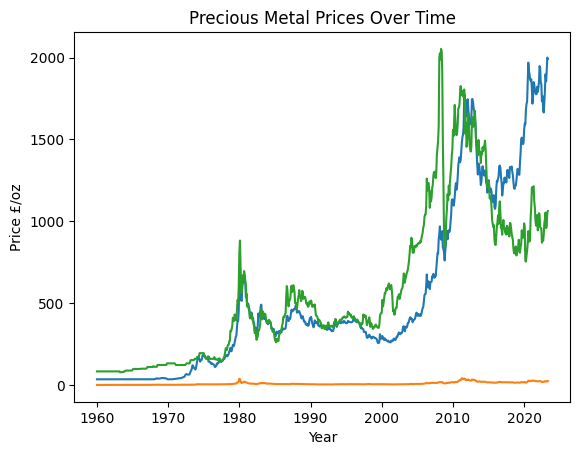

In [198]:
sns.lineplot(data = df, x = 'MONTH', y = 'GOLD')
sns.lineplot(data = df, x = 'MONTH', y = 'SILVER')
sns.lineplot(data = df, x = 'MONTH', y = 'PLATINUM')

plt.title('Precious Metal Prices Over Time')
plt.xlabel('Year')
plt.ylabel('Price £/oz')

Blue: Spot price of gold (pound sterling per troy oz)

Green: Spot price of platinum (pound sterling per troy oz)

Orange: Spot price of silver (pound sterling per troy oz)

- Gold is the most expensive precious metal in the commodities market as of May 1st, 2023.

- At certain points in time, gold and platinum prices are equal, while at other times, it appears that the prices are negatively correlated.

Text(0, 0.5, 'Price £/oz')

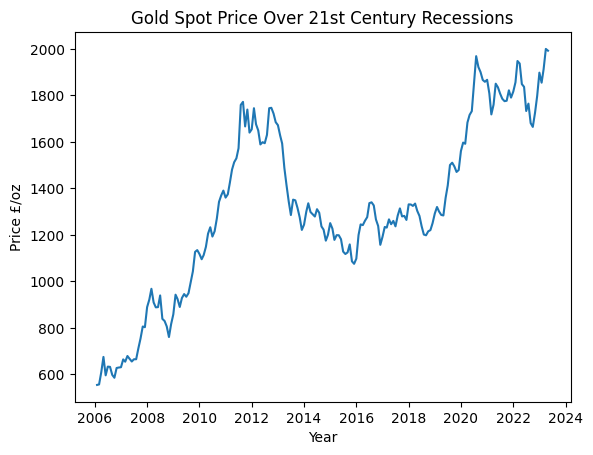

In [199]:
sns.lineplot(data = df[df['MONTH'] > '01-01-2006'], x = 'MONTH', y = 'GOLD')
plt.title('Gold Spot Price Over 21st Century Recessions')
plt.xlabel('Year')
plt.ylabel('Price £/oz')

- Note how the gold price increases as the recession begins in late 2007 and peaks in 2008.

- Gold hits the highest spot price ever in 2014... Until the Coronavirus pandemic spreads across the world.

Text(0, 0.5, 'Price £/oz')

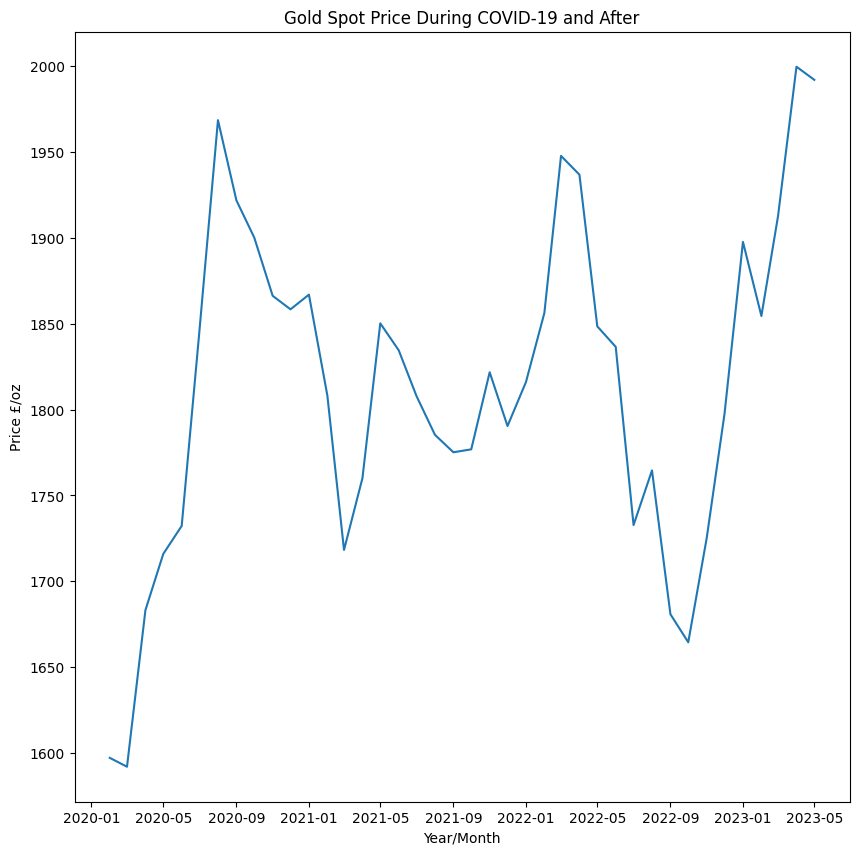

In [200]:
plt.figure(figsize = (10,10))
sns.lineplot(data = df[df['MONTH'] > '01-01-2020'], x = 'MONTH', y = 'GOLD')
plt.title('Gold Spot Price During COVID-19 and After')
plt.xlabel('Year/Month')
plt.ylabel('Price £/oz')

The price of gold increased considerably during the COVID-19 pandemic lockdown, rising from around £1600/oz to £2000/oz in less than a year. This highlights gold's value as a risk-mitigating portfolio addition.

Even after the pandemic, gold has not reverted to its pre-lockdown prices. Which commodities might explain this change in price?

#### Creating recession indicator

A new feature will be added to account for specific time periods during which there were economic recessions in the United States:

1. The Great Recession (2008 - 2009)
2. COVID-19 Coronavirus Pandemic (2020 - 2022)

The value will be 1 if the month falls within these time periods, otherwise 0.

In [201]:
def recession_feat(df, time, newname):
  """ creating recession indicator in dataset

  Args:

    df(dataframe): data to be analyzed
    time(string): time based variable
    newname(string): name of new column

  Returns:
    df(dataframe): dataset with recession indicator
  """

  sixties = (datetime(1960,5,5), datetime(1961, 2, 2 ))

  vietnam = (datetime(1969,12,12), datetime(1970, 11, 11))

  oil_embargo = (datetime(1973, 11, 11), datetime(1975, 3, 3))

  revolution_iran = (datetime(1980, 1, 1), datetime(1980, 7, 7))

  volcker = (datetime(1981, 7, 7), datetime(1982, 11,11))

  gulf_war = (datetime(1990, 7, 7), datetime(1991, 3, 3))

  dotcomburst = (datetime(2001, 3, 3), datetime(2001, 11, 11))

  greatrecession = (datetime(2007, 12, 12), datetime(2009, 10, 10))

  covid = (datetime(2020, 3, 1), datetime(2021, 12, 31))

  df[newname] = df[time].apply(lambda row: 1 if(
        (row >= sixties[0] and row <= sixties[1]) or
        (row >= vietnam[0] and row <= vietnam[1]) or
        (row >= oil_embargo[0] and row <= oil_embargo[1]) or
        (row >= revolution_iran[0] and row <= revolution_iran[1]) or
        (row >= volcker[0] and row <= volcker[1]) or
        (row >= gulf_war[0] and row <= gulf_war[1]) or
        (row >= dotcomburst[0] and row <= dotcomburst[1]) or
        (row >= greatrecession[0] and row <= greatrecession[1]) or
        (row >= covid[0] and row <= covid[1])
    ) else 0)

  df[newname] = df[newname].astype(bool)
  return df

df_copy = recession_feat(df.copy(), 'MONTH', 'REC_IND')

df_copy['REC_IND'] = df_copy['REC_IND'].astype(bool)
df_copy['REC_IND'].value_counts()


REC_IND
False    642
True     119
Name: count, dtype: int64

There are 119 months of economic recession indicated in the dataset.

#### Grouping variables by relevance

In [202]:
energy = ['CRUDE_PETRO', 'CRUDE_BRENT', 'CRUDE_DUBAI', 'CRUDE_WTI',
       'COAL_AUS', 'COAL_SAFRICA', 'NGAS_US', 'NGAS_EUR', 'NGAS_JP', 'iNATGAS', 'REC_IND']

caffeine = ['COCOA', 'COFFEE_ARABIC', 'COFFEE_ROBUS', 'TEA_AVG', 'TEA_COLOMBO',
       'TEA_KOLKATA', 'TEA_MOMBASA', 'TOBAC_US', 'REC_IND']

oils = ['COCONUT_OIL', 'FISH_MEAL',
       'GRNUT_OIL', 'PALM_OIL', 'PLMKRNL_OIL','SOYBEAN_OIL',
       'SOYBEAN_MEAL', 'RAPESEED_OIL', 'SUNFLOWER_OIL', 'REC_IND']

grains = ['COCOA', 'GRNUT', 'SOYBEANS','BARLEY', 'MAIZE',
       'SORGHUM', 'RICE_05', 'RICE_25', 'RICE_A1', 'RICE_05_VNM',
       'WHEAT_US_SRW', 'WHEAT_US_HRW','REC_IND' ]

food = ['BANANA_EU', 'BANANA_US', 'ORANGE',
       'BEEF', 'CHICKEN', 'LAMB', 'SHRIMP_MEX', 'SUGAR_EU', 'SUGAR_US',
       'SUGAR_WLD', 'REC_IND']

industrial = ['LOGS_CMR', 'LOGS_MYS', 'SAWNWD_CMR',
       'SAWNWD_MYS', 'PLYWOOD', 'COTTON_A_INDX', 'RUBBER_TSR20',
       'RUBBER1_MYSG', 'REC_IND']

metals = ['PHOSROCK', 'DAP', 'TSP', 'UREA_EE_BULK', 'POTASH',
       'ALUMINUM', 'IRON_ORE', 'COPPER', 'LEAD', 'Tin', 'NICKEL', 'Zinc', 'REC_IND']

precious_metals = ['GOLD', 'PLATINUM', 'SILVER', 'REC_IND']


Calculating correlations between variables in each category

In [203]:
ecorr = df_copy[energy].corr()
ccorr = df_copy[caffeine].corr()
ocorr = df_copy[oils].corr()
gcorr = df_copy[grains].corr()
fcorr = df_copy[food].corr()
icorr = df_copy[industrial].corr()
mcorr = df_copy[metals].corr()

**Precious Metals**


Gold, silver, and platinum are known as precious metals for their relatively short supply and high demand.

Seaborn's pairplot can display variance in prices and provide insights into how changes in prices compare across precious metals.

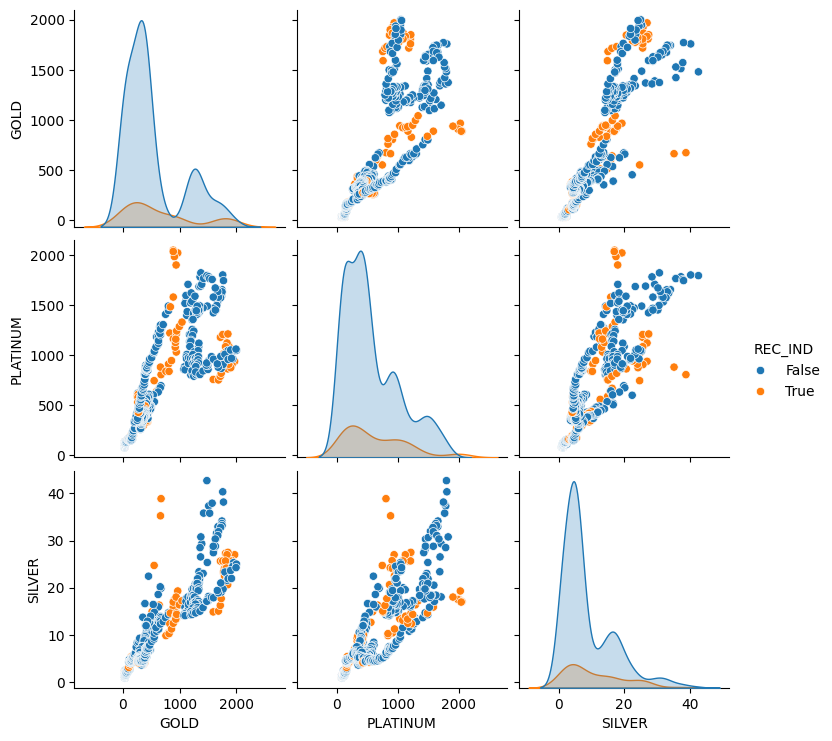

In [204]:
sns.pairplot(df_copy[precious_metals], hue = 'REC_IND')

In the Silver vs Gold visual, all outliers in silver prices occurred during economic recessions when gold was priced under £1000 per troy ounce.

The same pattern holds true for platinum when gold was selling at £1000.

**Energy Commodities**

These are the fuels that power the facilities and vehicles used to mine, refine, store, and in some cases, sell gold. Observing relationships between variables will help identify which energy commodities should be selected to predict the price of gold.

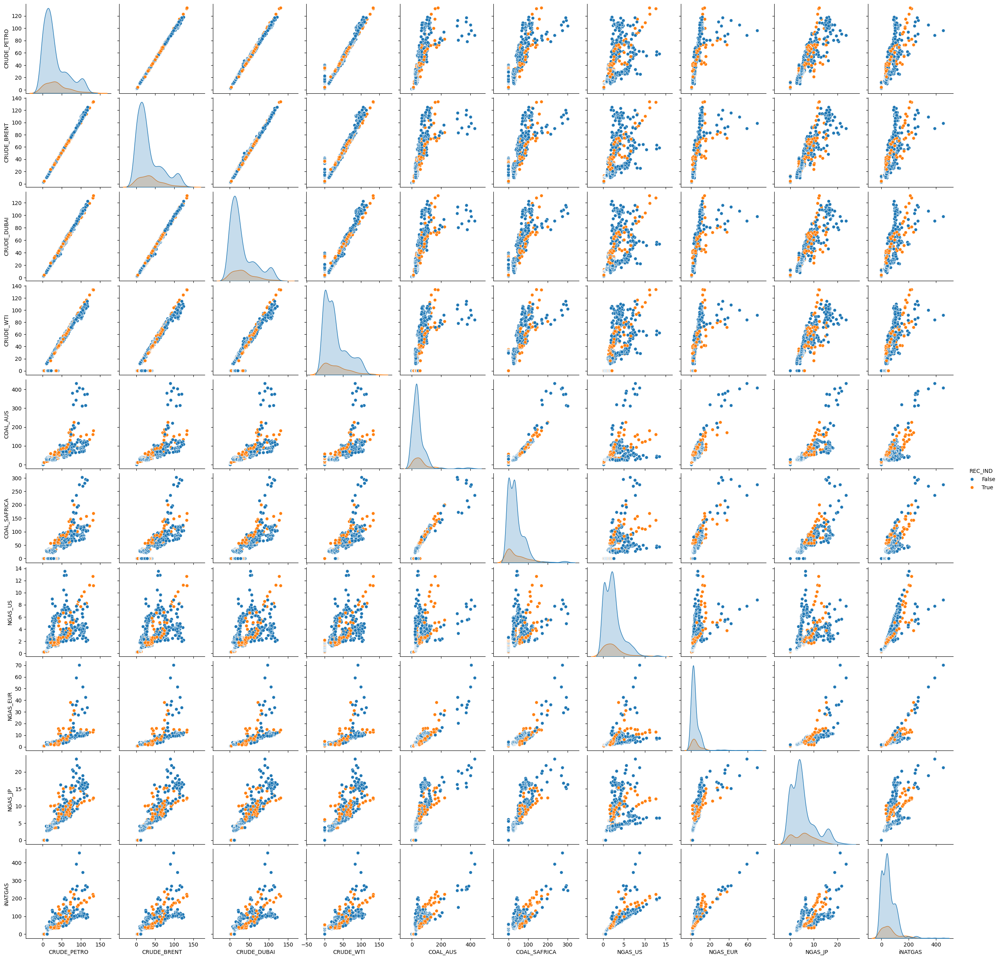

In [205]:
sns.pairplot(df_copy[energy], hue = 'REC_IND')

The majority of the energy products exhibit a linear relationship when plotted against each other.Majority of the energy products show a linear relationship when plotted against each other.

This relationship is most evident in commodities of the same type like crude oil.

**It is fair to assume that increases in certain energy commodities can explain increases in the others.**

<Axes: >

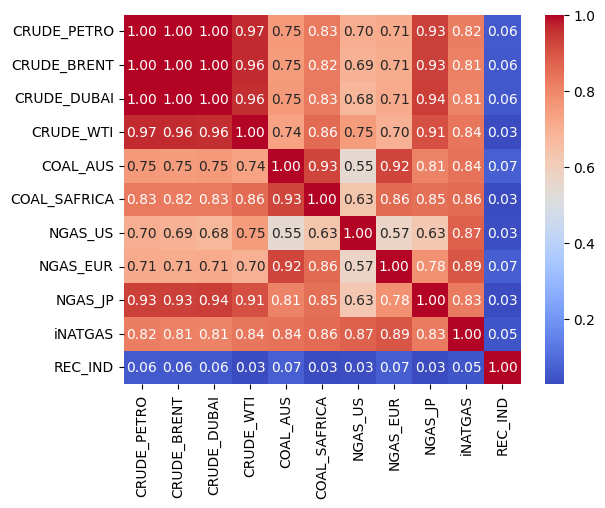

In [206]:
sns.heatmap(ecorr, annot=True, cmap='coolwarm', fmt = '.2f')

The majority of the correlations between features are strongly positive. One might consider using coal from Australia over coal from South Africa because it has a lower correlation with the prices of the other commodities. However, coal shows a strong positive correlation with natural gas from Europe. Additionally, one can consider using crude Dubai to represent crude oil prices for the model because it has nearly a 100% positive correlation with other crude oil prices while having a lower correlation with the rest of the features compared to other crude oils.

**Crude Oil**

Crude oil will be included in the set of commodities featuring in the variables that will be fit to the model because it is part of the gold supply chain. Crude oil is used to power the machinery used to mine and ship precious metals at an industrial level. The question is which type of crude should be used to represent the commodity.

By plotting the price of crude oil per type, whichever type is closest to the average will be selected to represent the price of oil per barrel in the final dataset. The best prediction that can be made is the average without knowing anything else about the price of crude oil. Including too many highly correlated variables might add unnecessary complexity when trying to project the price of gold.

If the prices of the different types of crude oils fluctuate similarly over time, only one of them is needed for the final feature set.

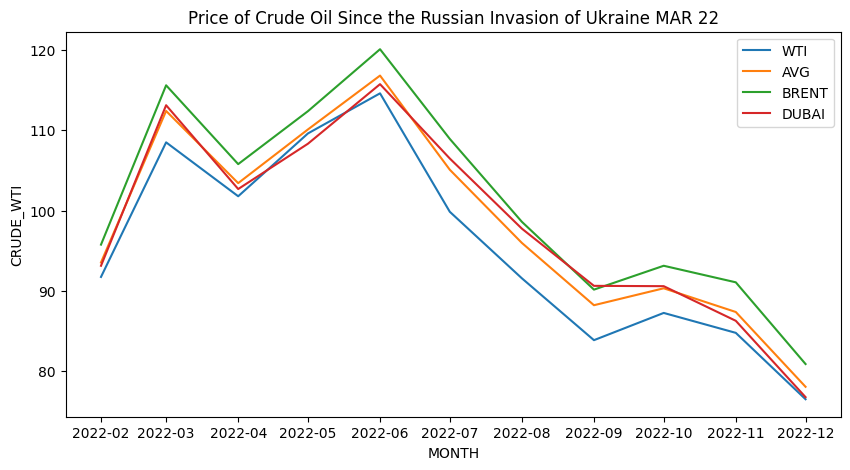

In [207]:

plt.figure(figsize=(10,5))
limited_time = df[df['MONTH'] > '01-01-2022']
df_sorted_wti = limited_time[limited_time['MONTH'] < '01-01-2023'].sort_values(by='CRUDE_WTI')
df_sorted_petro = limited_time[limited_time['MONTH'] < '01-01-2023'].sort_values(by='CRUDE_PETRO')
df_sorted_brent = limited_time[limited_time['MONTH'] < '01-01-2023'].sort_values(by='CRUDE_BRENT')
df_sorted_dubai = limited_time[limited_time['MONTH'] < '01-01-2023'].sort_values(by='CRUDE_DUBAI')
sns.lineplot(data = df_sorted_wti, x = 'MONTH', y = 'CRUDE_WTI', label = 'WTI')
sns.lineplot(data = df_sorted_petro, x = 'MONTH', y = 'CRUDE_PETRO', label = 'AVG')
sns.lineplot(data = df_sorted_brent, x = 'MONTH', y = 'CRUDE_BRENT', label = 'BRENT')
sns.lineplot(data = df_sorted_dubai, x = 'MONTH', y = 'CRUDE_DUBAI', label = 'DUBAI')
plt.title('Price of Crude Oil Since the Russian Invasion of Ukraine MAR 22')
plt.show()

Crude oil manufactured in the Arab Gulf, specifically Dubai, has a price that is closest to the average (petro). Without knowing anything about the relationship between the variables, the best prediction that could be made for a new instance is the average.

Therefore, we'll keep Dubai because its price is closest to the average of all the crude oil prices, as seen in the line graph above.

**Natural Gas**

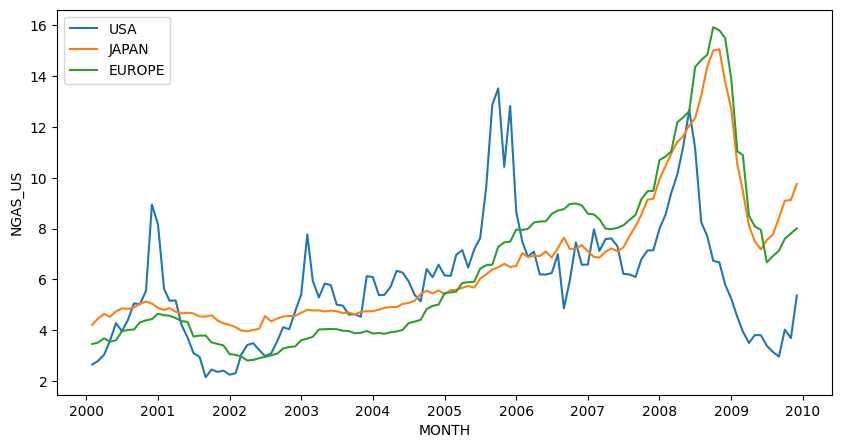

In [208]:
plt.figure(figsize=(10,5))
limited_time = df[df['MONTH'] > '01-01-2000']
df_sorted_ngasusa = limited_time[limited_time['MONTH'] < '01-01-2010'].sort_values(by='NGAS_US')
df_sorted_ngasjp = limited_time[limited_time['MONTH'] < '01-01-2010'].sort_values(by='NGAS_JP')
df_sorted_ngaseu = limited_time[limited_time['MONTH'] < '01-01-2010'].sort_values(by='NGAS_EUR')

sns.lineplot(data = df_sorted_ngasusa, x = 'MONTH', y = 'NGAS_US', label = 'USA')
sns.lineplot(data = df_sorted_ngasjp, x = 'MONTH', y = 'NGAS_JP', label = 'JAPAN')
sns.lineplot(data = df_sorted_ngaseu, x = 'MONTH', y = 'NGAS_EUR', label = 'EUROPE')
plt.show()

We'll keep natural gas USA because it has the lowest correlation with features that are unrelated to natural gas.

The feature set to train pre-built predictive models will only include the price of US natural gas.

**Caffeine**

<Axes: >

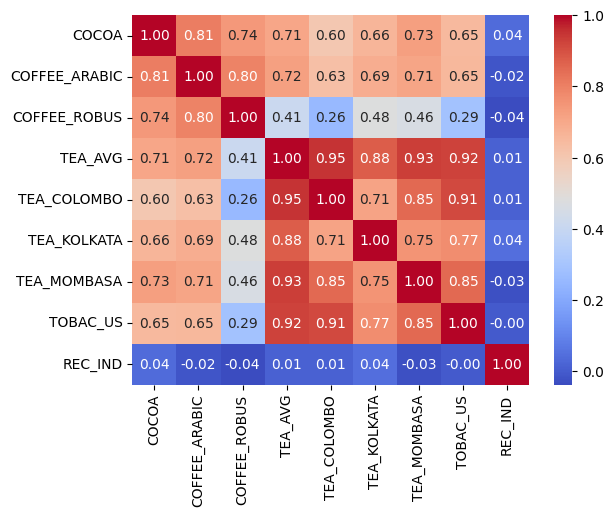

In [209]:
sns.heatmap(ccorr, annot=True, cmap='coolwarm', fmt = '.2f')

One might consider removing tea variables from the data because they have a strong positive correlation with tobacco.

While tobacco exhibits less of a linear relationship with coffee and cocoa.

One might select coffee arabica over robusta because it changes similarly to the rest of the caffeine products, and its correlation does not breach the threshold employed by the project.

Coffee robusta may add more variance that can skew interpretability.

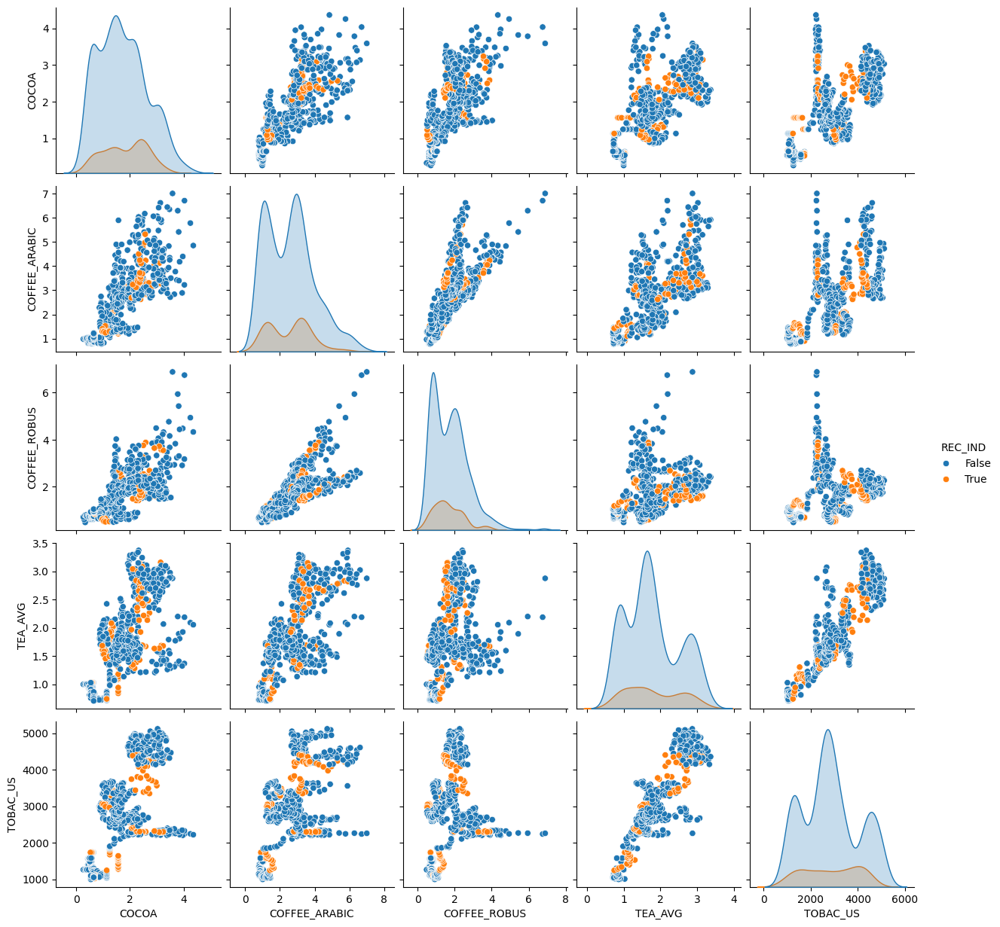

In [210]:
caff_preds = [i for i in caffeine if i not in ['TEA_KOLKATA', 'TEA_MOMBASA', 'TEA_COLOMBO']]
sns.pairplot(df_copy[caff_preds], hue = 'REC_IND')

**Oils and Meals**

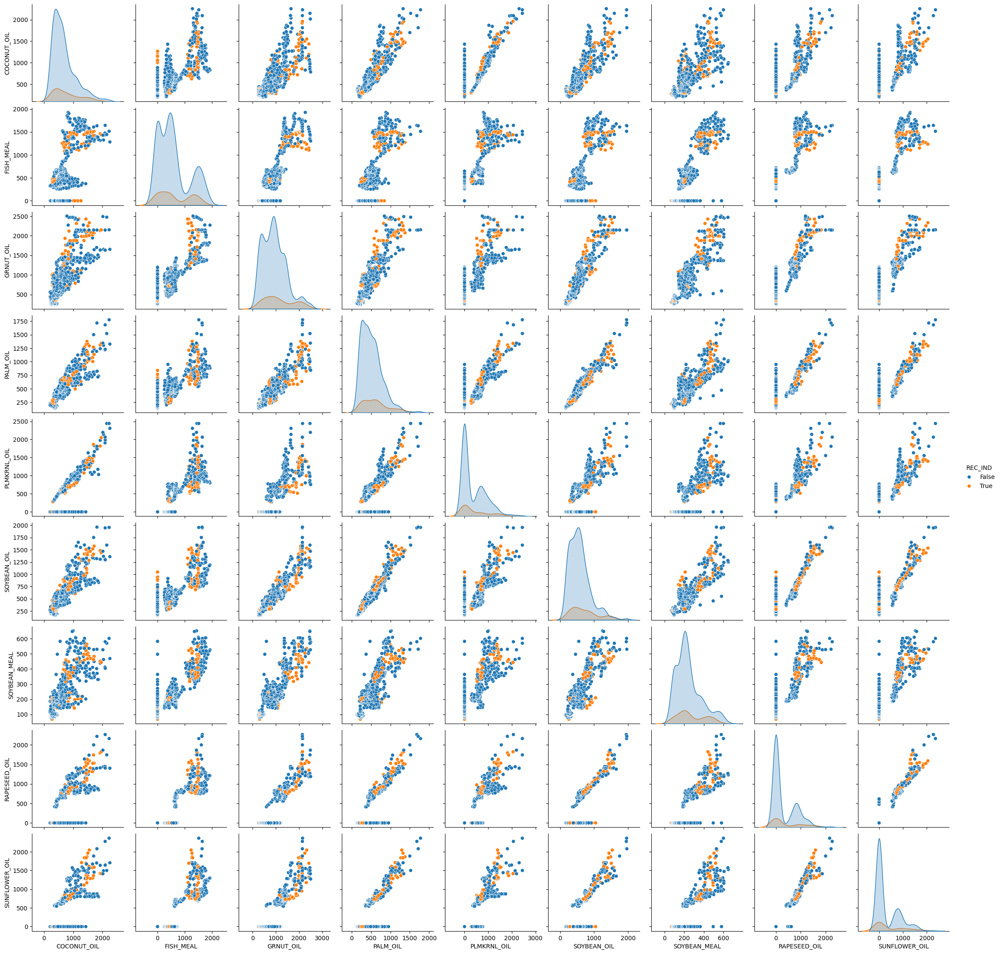

In [211]:
sns.pairplot(df_copy[oils], hue = 'REC_IND')

Oils and meals generally share a linear relationship between each of the commodities.

**Validating above statement with correlation heatmap**

<Axes: >

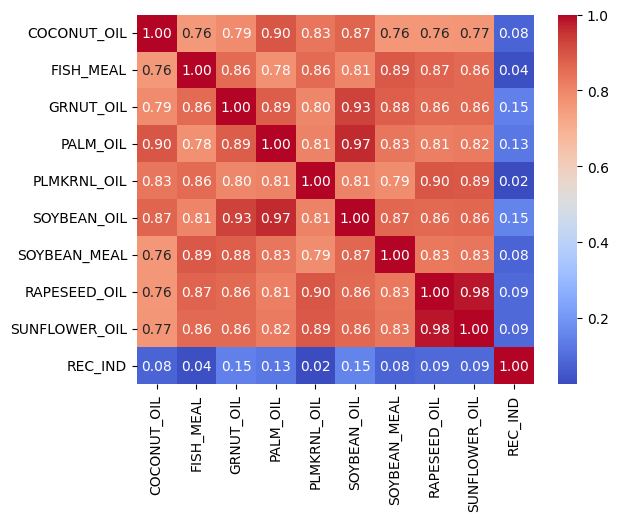

In [212]:
sns.heatmap(ocorr, annot=True, cmap = 'coolwarm', fmt = '.2f')

All of the oils and meals commodities have a correlation coefficent above 0.8 except for coconut oil. Therefore coconut oil might be included in the final dataset

**Grains**

In [213]:
df_copy[grains].describe()

,COCOA,GRNUT,SOYBEANS,BARLEY,MAIZE,SORGHUM,RICE_05,RICE_25,RICE_A1,RICE_05_VNM,WHEAT_US_SRW,WHEAT_US_HRW
count,761.000000,761.000000,761.000000,761.000000,761.000000,761.000000,761.000000,761.000000,761.000000,761.000000,761.000000,761.000000
mean,1.736502,795.825627,284.717668,79.758327,124.542760,108.403326,299.578791,183.297324,168.705615,112.695694,120.675531,160.337201
std,0.880678,636.320545,140.153460,53.019393,65.406246,58.714283,137.193564,181.009174,172.177725,181.275387,96.751699,83.070464
min,0.259000,0.000000,88.000000,0.000000,38.000000,0.000000,95.670000,0.000000,0.000000,0.000000,0.000000,52.180000
25%,1.034400,0.000000,202.000000,39.950000,85.430000,67.190000,190.800000,0.000000,0.000000,0.000000,0.000000,108.390000
50%,1.609600,871.820000,257.000000,73.140000,110.000000,103.065985,277.250000,181.500000,153.000000,0.000000,133.380000,150.146009
75%,2.342860,1213.640000,361.000000,102.860000,152.259677,133.800592,399.000000,313.000000,287.000000,272.000000,175.980133,191.075072
max,4.362900,2528.428094,737.060000,265.693454,348.166655,302.526583,907.000000,700.000000,762.666667,780.000000,446.656052,522.290000


- COCOA is the commodity in grains with the lowest variance in price over time.

- Barley has relatively low variance in price , but not as low as Cocoa.

<Axes: >

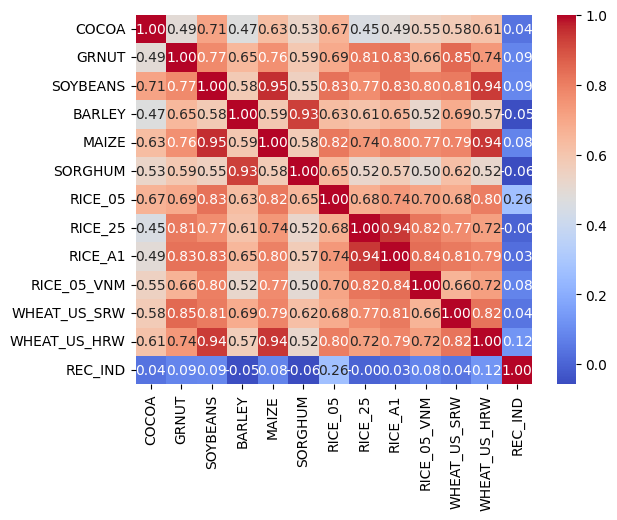

In [214]:
sns.heatmap(gcorr, annot=True, cmap='coolwarm', fmt = '.2f')

- Barley does not violate the correlation threshold with the other variables except for SORGHUM

- Soybean could be used to represent all products that cotain soybean (Ex: soybean oil).



**Food**

<Axes: >

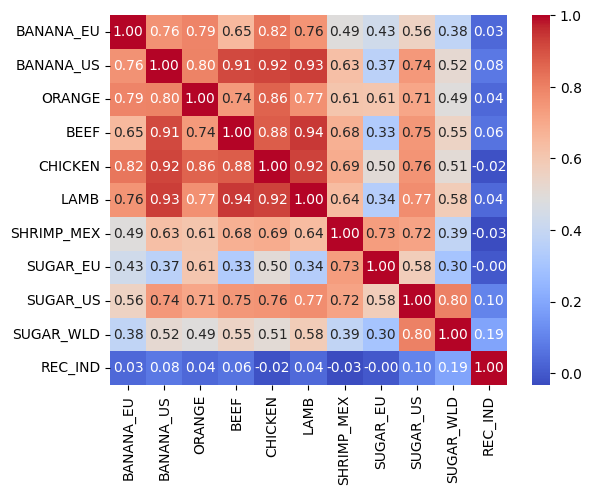

In [215]:
sns.heatmap(fcorr, annot=True, cmap='coolwarm', fmt = '.2f')

- Sugar USA seems to be the most ideal representative of this feature group.

- Need to check how it plots relative to the world price and the EU price of sugar over time

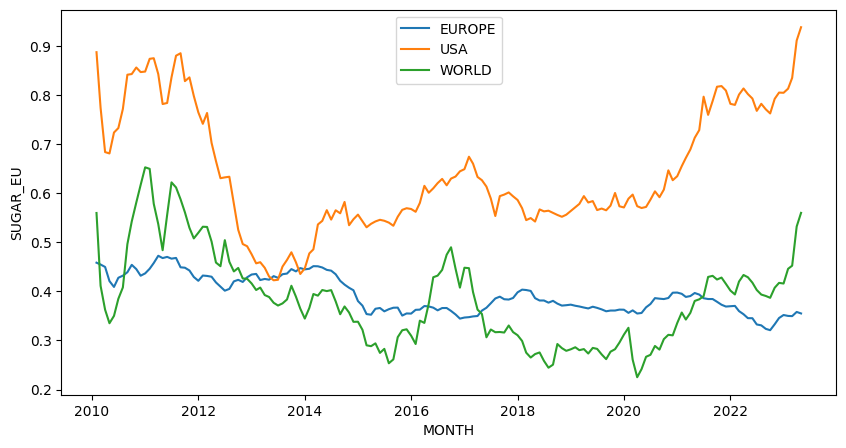

In [216]:
plt.figure(figsize=(10,5))
limited_time = df[df['MONTH'] > '01-01-2000']
df_sorted_sugareu = limited_time[limited_time['MONTH'] > '01-01-2010'].sort_values(by='SUGAR_EU')
df_sorted_sugarus = limited_time[limited_time['MONTH'] > '01-01-2010'].sort_values(by='SUGAR_US')
df_sorted_wld = limited_time[limited_time['MONTH'] > '01-01-2010'].sort_values(by='SUGAR_WLD')

sns.lineplot(data = df_sorted_sugareu, x = 'MONTH', y = 'SUGAR_EU', label = 'EUROPE')
sns.lineplot(data = df_sorted_sugarus, x = 'MONTH', y = 'SUGAR_US', label = 'USA')
sns.lineplot(data = df_sorted_wld, x = 'MONTH', y = 'SUGAR_WLD', label = 'WORLD')
plt.show()

As of May 2023, the world price changes over time very similarly to that of the US.

There are multiple instances over time where the world price and US price peak and trough at the same time.

SUGAR_US and SUGAR_EU will be selected as features since the US price and world price move similarly, and the US price has a higher correlation with the rest of the commodities.

**Industrial Goods**

<Axes: >

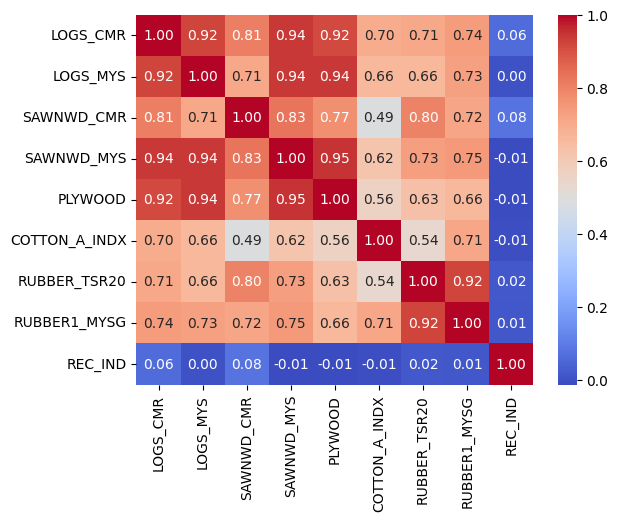

In [217]:
sns.heatmap(icorr, annot=True, cmap='coolwarm', fmt = '.2f')

Rubber and cotton have the lowest correlation in this category.

Plywood has a high positive correlation with logs and sawnwood because they are both wood.

One might consider including rubber or cotton in the data to train the model.

**Metals and Fertilizers**

<Axes: >

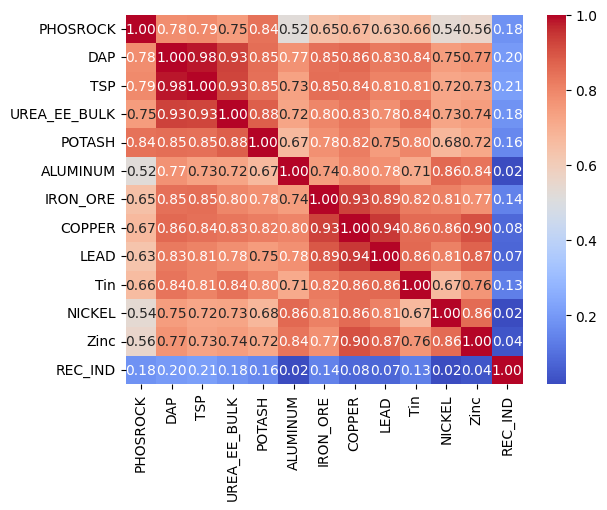

In [218]:
sns.heatmap(mcorr, annot=True, cmap='coolwarm', fmt = '.2f')

**Feature Selection Summary:**

- POTASH has a strong positive correlation with all metals and fertilizer commodities.
- Phosphorus rock will be selected because it does not breach the correlation threshold with any other variable except for POTASH.

**Insights and Summary:**

Limit energy predictors to: CRUDE_DUBAI, NGAS_US, NGAS_EU.
Limit food predictors to: SUGAR_US, SUGAR_EU.
Limit metals/fertilizers to: PHOSROCK.
Eliminate oils, grains, meals, caffeine variables from analysis.

#### Commodities Selection:

At this stage of the project, a free, pre-built regression tree will be trained to predict the price of gold given the monthly prices of 71 commodities since January 1960. Statistical modeling can understand more complex relationships in the data and can reveal more about how commodity prices interact with each other. The decision-making hierarchy of the tree will reflect commodity price predictability.

**Remember:**

The conclusions drawn in the EDA suggest that CRUDE_DUBAI, NGAS_US, NGAS_EU, SUGAR_US, SUGAR_EU, and PHOSROCK should be selected as the commodities that would optimize the complexity of predictive models.

Which six commodities would the regression tree select if it had to predict the spot price of gold?

**Feature Predictability: Using Tree-Based Methods**

Visualizing decision tree results will assist in feature selection and validate if selected features from EDA are the best for predicting the price of gold.

In [219]:
from sklearn import tree
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.metrics import max_error, r2_score, max_error, mean_absolute_error, mean_squared_error
!pip install graphviz
import graphviz
from sklearn.tree import plot_tree

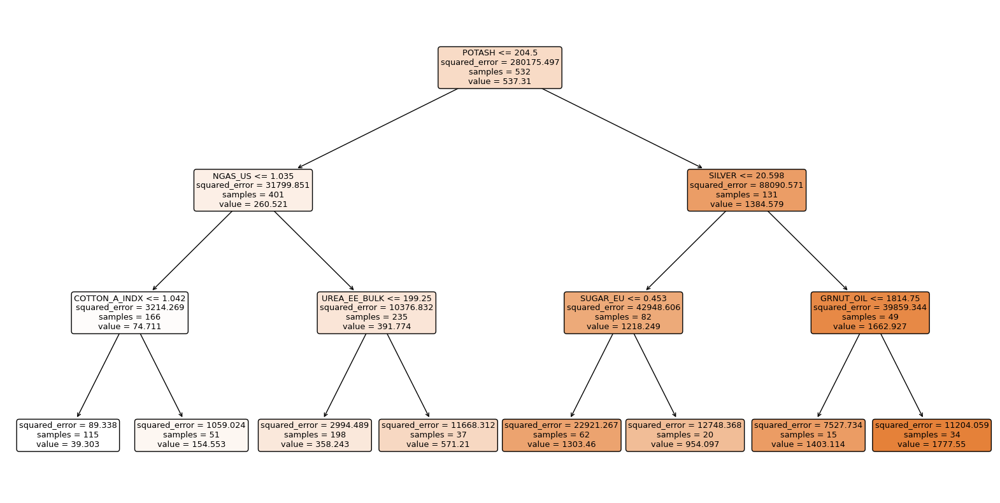

In [220]:
from sklearn.tree import plot_tree

##gathering our predictors
columns = df_copy.columns
predictors = [i for i in columns if i not in ['MONTH', 'GOLD']]

#separate target from predictors
X = df_copy[predictors]
y = df_copy['GOLD']

#split to training and testing 70:30
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.30, random_state = 0)

#fit tree
tree1 = tree.DecisionTreeRegressor(min_samples_leaf = 3, max_depth = 3)

tree1.fit(X_train, y_train)
# Fit your decision tree model
tree1.fit(X_train, y_train)

# Convert index to list
feature_names = list(X_train.columns)

# Visualize the decision tree
plt.figure(figsize=(20,10))
plot_tree(tree1, feature_names=feature_names, filled=True, rounded=True)
plt.show()


**Top-Down Approach**

- The price of potassium chloride (POTASH) is the most predictive in predicting the price of gold. In other words, the price of potash needs to be figured out first before predicting the spot price of gold according to the regression tree.

- The second most predictive features are silver and natural gas.

<Axes: xlabel='MONTH', ylabel='POTASH'>

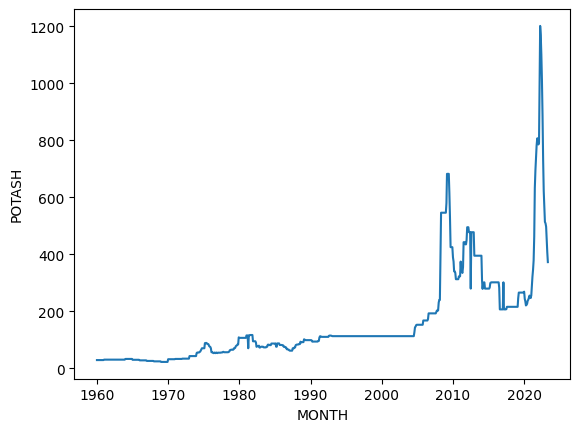

In [221]:
sns.lineplot(data = df, x = 'MONTH', y = 'POTASH')

- Potash predictability needs investigation.

- Compare potash to gold price to see relationship


<Axes: xlabel='GOLD', ylabel='POTASH'>

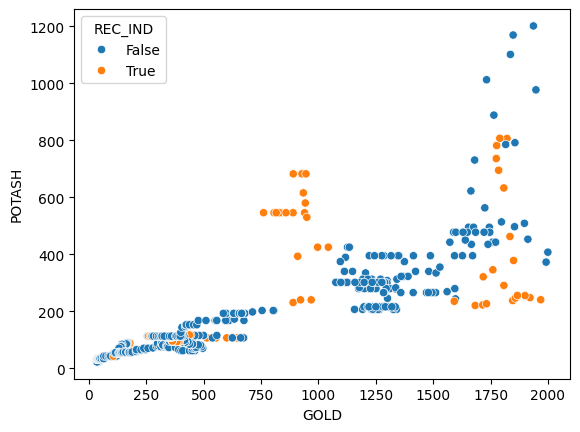

In [222]:
sns.scatterplot(df_copy, x = 'GOLD', y = 'POTASH', hue = 'REC_IND')

- Potash seems to spike at every $750 price increase in gold

- Price increases in potassium chloride appear to happen during recessions as well.


Text(0.5, 0, 'Year')

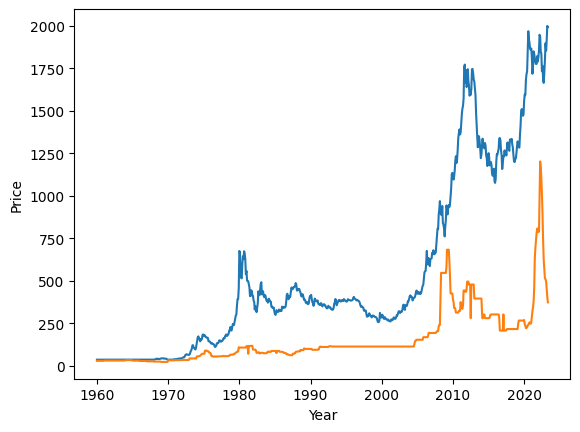

In [223]:
sns.lineplot(df_copy, x = 'MONTH', y = 'GOLD')
sns.lineplot(df_copy, x = 'MONTH', y = 'POTASH')
plt.ylabel('Price')
plt.xlabel('Year')

- The spot prices of gold and potash fluctuate similarly starting in the early 2000's

**What would an optimized regression tree say?**

A tree that is optimized for predicting gold at various depths and sample levels can present more insight than a model limited to only six features.


In [224]:
!pip install graphviz

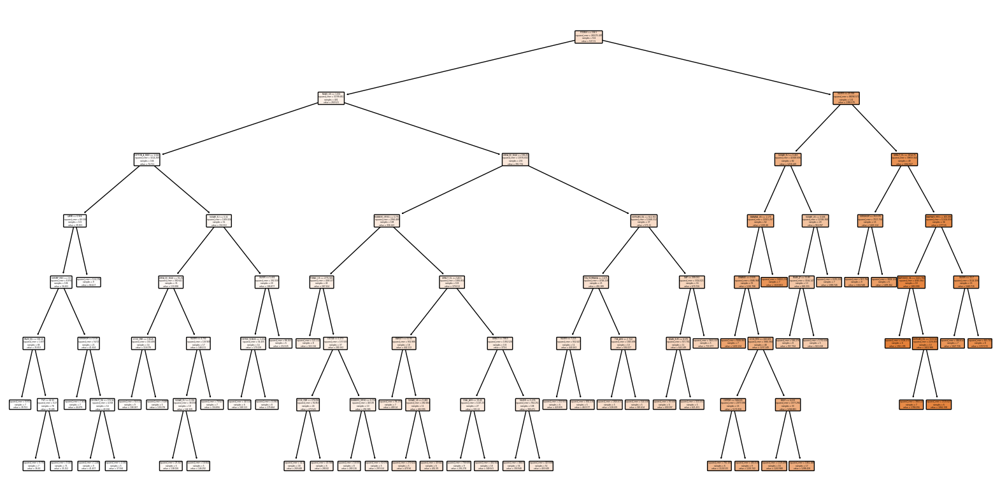

In [225]:
import graphviz
from sklearn.tree import plot_tree
#optimize tree
#Evaluate for various terminal nodes and minimum samples per leaf
param_grid = {'max_depth': [3, 5, 7],
              'min_samples_leaf': [3, 5, 7]}

gridsearch = GridSearchCV(estimator = tree1, param_grid = param_grid, cv = 10)

gridsearch.fit(X_train, y_train)

#Get the best parameters
best_params = gridsearch.best_params_

#Fit the model with the best parameters
best_tree = tree.DecisionTreeRegressor(max_depth=best_params['max_depth'], min_samples_leaf=best_params['min_samples_leaf'])
best_tree.fit(X_train, y_train)


# Convert index to list
feature_names = list(X_train.columns)

# Visualize the decision tree
plt.figure(figsize=(20,10))
plot_tree(best_tree, feature_names=feature_names, filled=True, rounded=True)
plt.show()

(This graph has been run on an other environment)

- The features towards the right side of the trees might be more informative since the current POTASH spot price is greater than $204.

- Silver, natural gas, and sugar are selected more commonly as the criteria for splitting at various nodes in the hierarchy.

--> Spot prices of silver, natural gas, and sugar might be more relevant in determining the dollar value per troy ounce of gold than potash.

**Conclusions from Regression Tree**

Spot prices of silver, natural gas, sugar, and potassium chloride are the most predictive variables in predicting the price of gold per ounce.

**Consider including the following features in the final dataset to fit the model:**

- Silver
- Natural Gas
- Sugar (US or EU)
- Potassium Chloride

**Feature Selection**

The regression tree verifies the selection of: silver, natural gas, and sugar.

Keep crude oil because it is part of gold's supply chain and, therefore, important in determining the price of gold.

## 2. Consumer price index (cpi_df)

In [226]:
cpi_df

,Month,USA_CPI,AUT_CPI,CAN_CPI,SA_CPI,UK_CPI,SUI_CPI,FRA_CPI,GER_CPI,IL_CPI,ITA_CPI,PRC_CPI,RUS_CPI
0,197001,15.900,22.5,16.000,1.700,8.1,33.400,14.30,29.2918,0.0,5.5,0.0,0.000
1,197002,16.000,22.5,16.000,1.700,8.2,33.400,14.40,29.3570,0.0,5.6,0.0,0.000
2,197003,16.100,22.5,16.000,1.700,8.2,33.400,14.40,29.4875,0.0,5.6,0.0,0.000
3,197004,16.200,22.5,16.000,1.800,8.3,33.400,14.50,29.6180,0.0,5.6,0.0,0.000
4,197005,16.300,22.6,16.000,1.800,8.4,33.700,14.50,29.6180,0.0,5.7,0.0,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
634,202211,125.600,125.3,121.700,144.600,124.8,104.900,114.30,119.8720,108.6,118.7,132.4,226.166
635,202212,125.222,125.5,120.964,145.156,125.3,104.666,114.16,119.3450,108.9,119.0,132.3,226.329
636,202301,126.223,126.6,121.596,145.021,124.8,105.296,114.60,120.5050,109.2,119.1,133.3,226.271
637,202302,126.928,127.8,122.070,146.101,126.0,106.082,115.78,121.4530,109.7,119.3,132.7,226.255


CPI is a measure used to evaluate changes in the price level of consumer goods and services over time, commonly used as an indicator of inflation.

The granularity of the observations is **monthly** and **starts** in 1970 and **finishes** in 2023.

In [227]:
cpi_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 639 entries, 0 to 638
Data columns (total 13 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   Month    639 non-null    int64  
 1   USA_CPI  639 non-null    float64
 2   AUT_CPI  639 non-null    float64
 3   CAN_CPI  639 non-null    float64
 4   SA_CPI   639 non-null    float64
 5   UK_CPI   639 non-null    float64
 6   SUI_CPI  639 non-null    float64
 7   FRA_CPI  639 non-null    float64
 8   GER_CPI  639 non-null    float64
 9   IL_CPI   639 non-null    float64
 10  ITA_CPI  639 non-null    float64
 11  PRC_CPI  639 non-null    float64
 12  RUS_CPI  639 non-null    float64
dtypes: float64(12), int64(1)
memory usage: 65.0 KB


639 rows, the CPI are in the right data type but the month is not well formulated.

We change the date format:

In [228]:
# Convert the 'Month' column to a datetime format
cpi_df['Month'] = pd.to_datetime(cpi_df['Month'], format='%Y%m')

cpi_df

,Month,USA_CPI,AUT_CPI,CAN_CPI,SA_CPI,UK_CPI,SUI_CPI,FRA_CPI,GER_CPI,IL_CPI,ITA_CPI,PRC_CPI,RUS_CPI
0,1970-01-01,15.900,22.5,16.000,1.700,8.1,33.400,14.30,29.2918,0.0,5.5,0.0,0.000
1,1970-02-01,16.000,22.5,16.000,1.700,8.2,33.400,14.40,29.3570,0.0,5.6,0.0,0.000
2,1970-03-01,16.100,22.5,16.000,1.700,8.2,33.400,14.40,29.4875,0.0,5.6,0.0,0.000
3,1970-04-01,16.200,22.5,16.000,1.800,8.3,33.400,14.50,29.6180,0.0,5.6,0.0,0.000
4,1970-05-01,16.300,22.6,16.000,1.800,8.4,33.700,14.50,29.6180,0.0,5.7,0.0,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
634,2022-11-01,125.600,125.3,121.700,144.600,124.8,104.900,114.30,119.8720,108.6,118.7,132.4,226.166
635,2022-12-01,125.222,125.5,120.964,145.156,125.3,104.666,114.16,119.3450,108.9,119.0,132.3,226.329
636,2023-01-01,126.223,126.6,121.596,145.021,124.8,105.296,114.60,120.5050,109.2,119.1,133.3,226.271
637,2023-02-01,126.928,127.8,122.070,146.101,126.0,106.082,115.78,121.4530,109.7,119.3,132.7,226.255


In [229]:
cpi_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 639 entries, 0 to 638
Data columns (total 13 columns):
 #   Column   Non-Null Count  Dtype         
---  ------   --------------  -----         
 0   Month    639 non-null    datetime64[ns]
 1   USA_CPI  639 non-null    float64       
 2   AUT_CPI  639 non-null    float64       
 3   CAN_CPI  639 non-null    float64       
 4   SA_CPI   639 non-null    float64       
 5   UK_CPI   639 non-null    float64       
 6   SUI_CPI  639 non-null    float64       
 7   FRA_CPI  639 non-null    float64       
 8   GER_CPI  639 non-null    float64       
 9   IL_CPI   639 non-null    float64       
 10  ITA_CPI  639 non-null    float64       
 11  PRC_CPI  639 non-null    float64       
 12  RUS_CPI  639 non-null    float64       
dtypes: datetime64[ns](1), float64(12)
memory usage: 65.0 KB


### Extracting Date Components

We extracting the date compents so we can do futher analysis on the dataset.

In [230]:
# Extract Year, Month, Day, and Day of Week without overwriting the original 'Month' column
cpi_df['Year'] = cpi_df['Month'].dt.year
cpi_df['ExtractedMonth'] = cpi_df['Month'].dt.month
cpi_df['Day'] = cpi_df['Month'].dt.day
cpi_df['DayOfWeek'] = cpi_df['Month'].dt.dayofweek  # Monday=0, Sunday=6

# Get the month name and weekday name for more intuitive analysis
cpi_df['MonthName'] = cpi_df['Month'].dt.month_name()
cpi_df['DayOfWeekName'] = cpi_df['Month'].dt.day_name()

cpi_df

,Month,USA_CPI,AUT_CPI,CAN_CPI,SA_CPI,UK_CPI,SUI_CPI,FRA_CPI,GER_CPI,IL_CPI,ITA_CPI,PRC_CPI,RUS_CPI,Year,ExtractedMonth,Day,DayOfWeek,MonthName,DayOfWeekName
0,1970-01-01,15.900,22.5,16.000,1.700,8.1,33.400,14.30,29.2918,0.0,5.5,0.0,0.000,1970,1,1,3,January,Thursday
1,1970-02-01,16.000,22.5,16.000,1.700,8.2,33.400,14.40,29.3570,0.0,5.6,0.0,0.000,1970,2,1,6,February,Sunday
2,1970-03-01,16.100,22.5,16.000,1.700,8.2,33.400,14.40,29.4875,0.0,5.6,0.0,0.000,1970,3,1,6,March,Sunday
3,1970-04-01,16.200,22.5,16.000,1.800,8.3,33.400,14.50,29.6180,0.0,5.6,0.0,0.000,1970,4,1,2,April,Wednesday
4,1970-05-01,16.300,22.6,16.000,1.800,8.4,33.700,14.50,29.6180,0.0,5.7,0.0,0.000,1970,5,1,4,May,Friday
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
634,2022-11-01,125.600,125.3,121.700,144.600,124.8,104.900,114.30,119.8720,108.6,118.7,132.4,226.166,2022,11,1,1,November,Tuesday
635,2022-12-01,125.222,125.5,120.964,145.156,125.3,104.666,114.16,119.3450,108.9,119.0,132.3,226.329,2022,12,1,3,December,Thursday
636,2023-01-01,126.223,126.6,121.596,145.021,124.8,105.296,114.60,120.5050,109.2,119.1,133.3,226.271,2023,1,1,6,January,Sunday
637,2023-02-01,126.928,127.8,122.070,146.101,126.0,106.082,115.78,121.4530,109.7,119.3,132.7,226.255,2023,2,1,2,February,Wednesday


### Trend analysis

In [231]:
# Aggregating data by Month for plotting
monthly_data = cpi_df.resample('M', on='Month').mean()  # Monthly average

# Create a plot
plt.figure(figsize=(14, 8))

# Plotting each country's CPI
countries_cpi = ['USA_CPI', 'AUT_CPI', 'CAN_CPI', 'SA_CPI', 'UK_CPI', 'SUI_CPI',
                 'FRA_CPI', 'GER_CPI', 'IL_CPI', 'ITA_CPI', 'PRC_CPI', 'RUS_CPI']

for cpi in countries_cpi:
    plt.plot(monthly_data.index, monthly_data[cpi], marker='.', linestyle='-', label=cpi)

# Adding plot title and labels
plt.title('Monthly Trend of CPI for Various Countries')
plt.xlabel('Date')
plt.ylabel('CPI')
plt.xticks(rotation=45)
plt.legend(title='Country', loc='upper left')

# Show the plot
plt.show()

/tmp/ipykernel_31742/1548312108.py:2: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_data = cpi_df.resample('M', on='Month').mean()  # Monthly average


TypeError: agg function failed [how->mean,dtype->object]

Analyzing the provided graph which shows the monthly trend of the Consumer Price Index (CPI) for various countries, here are some observations and insights:

1. **General Trend**: All countries depicted on the graph demonstrate an upward trend in CPI over the timeline from the 1970s to the early 2020s. This indicates overall inflation across all economies, where the general price level of goods and services has increased.

2. **Country Specific Trends**:
   - **USA CPI**: Shows the most significant rise, particularly post-2010, with an especially steep increase after 2020. This could reflect recent economic stimuli, such as increased monetary supply or fiscal policies reacting to economic downturns and crises.
   - **RUS CPI**: Also displays a rapid increase similar to the USA, which could be influenced by geopolitical events, sanctions, or economic policies unique to Russia.

3. **Stability vs. Volatility**:
   - **SUI (Switzerland) and UK**: Both show relatively stable growth in CPI compared to others. Switzerland, known for its conservative monetary policies, shows controlled inflation levels.
   - **SA (South Africa)** and **RUS**: Exhibit more volatile changes, particularly in recent years, which could be due to economic instability or external economic pressures.

4. **Late 20th Century Stability**: Between 1970 and the late 1990s, most countries showed a relatively stable, gradual increase in CPI, which might indicate periods of stable economic growth and effective inflation control during these years.

5. **Early 21st Century Acceleration**: From around 2000, there is a noticeable acceleration in CPI growth in many countries, likely due to globalization, changes in monetary policies, and perhaps the integration of emerging market economies into the global market.

6. **Recent Sharp Increases**:
   - **Post-2020 Surge**: This is prominently seen in the USA and Russia, and it may be a result of the economic impact of the COVID-19 pandemic, including disruptions in supply chains and changes in consumer behavior.

7. **Implications for Policymakers**:
   - The varied rate of inflation across different countries and periods highlights the impact of different economic policies and conditions. Policymakers might use this data to compare the effectiveness of inflation control measures.
   - The recent sharp increases in CPI may call for revised or new economic strategies to stabilize inflation without stifling growth.

This graph serves as a powerful tool for economic comparison and analysis, offering insights into how different countries have managed inflation across several decades and how external and internal factors have influenced these trends.

### Correlation matrix

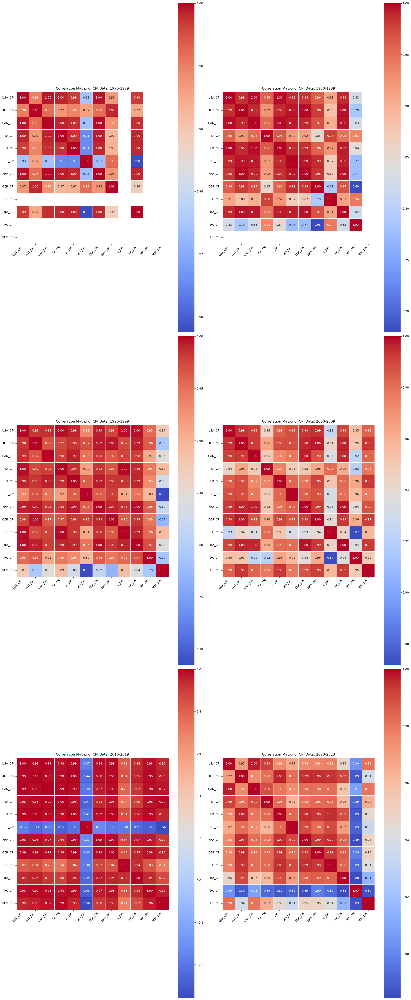

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming cpi_df is your dataframe and 'Year' is a column that contains the year of each record
# cpi_df = pd.read_csv('your_file.csv')  # Load your data file here if needed

# Convert 'Year' to datetime if it's not already
cpi_df['Year'] = pd.to_datetime(cpi_df['Year'], format='%Y')

# List of decades to analyze plus the most recent years
decades = [1970, 1980, 1990, 2000, 2010]
recent_years = 2020  # Start year of the most recent period

# CPI columns
cpi_columns = ['USA_CPI', 'AUT_CPI', 'CAN_CPI', 'SA_CPI', 'UK_CPI',
               'SUI_CPI', 'FRA_CPI', 'GER_CPI', 'IL_CPI', 'ITA_CPI',
               'PRC_CPI', 'RUS_CPI']

# Initialize the figure size and layout
total_periods = len(decades) + 1  # Adding one more period for the recent years
plt.figure(figsize=(20, total_periods * 8))
plot_number = 1  # Initialize subplot number

# Loop through each decade and compute the correlation matrix
for start_year in decades:
    end_year = start_year + 10

    # Filter data for the decade
    mask = (cpi_df['Year'] >= pd.to_datetime(f'{start_year}-01-01')) & (cpi_df['Year'] < pd.to_datetime(f'{end_year}-01-01'))
    decade_df = cpi_df.loc[mask, cpi_columns]

    # Compute the correlation matrix
    correlation_matrix = decade_df.corr()

    # Plot the correlation matrix in a subplot
    plt.subplot(total_periods // 2 + total_periods % 2, 2, plot_number)
    sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm',
                cbar=True, square=True, linewidths=.5)
    plt.title(f'Correlation Matrix of CPI Data: {start_year}-{end_year-1}')
    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=0)

    plot_number += 1  # Increment subplot number

# Additionally, handle the most recent period from 2020 to 2023
mask = (cpi_df['Year'] >= pd.to_datetime(f'{recent_years}-01-01'))
recent_df = cpi_df.loc[mask, cpi_columns]
correlation_matrix = recent_df.corr()

# Plot the correlation matrix for the recent period
plt.subplot(total_periods // 2 + total_periods % 2, 2, plot_number)
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm',
            cbar=True, square=True, linewidths=.5)
plt.title(f'Correlation Matrix of CPI Data: {recent_years}-2023')
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()


Analyzing the correlation matrices for each decade from the 1970s to the 2010s, the patterns reveal several important trends and shifts in the interrelationships among different countries' Consumer Price Indexes (CPI). Here’s a detailed analysis:

**1970s:**
- **Uniformity and High Correlation:** The 1970s show extremely high correlations between all countries, often at or near 1.00. This suggests that during this decade, CPI movements were almost universally synchronized across these economies. This could reflect global economic conditions of the time, such as the oil crisis, which had a widespread impact.

**1980s:**
- **Slight Diversification:** While still highly correlated, there is a slight decrease in correlation values in the 1980s compared to the 1970s. For example, the correlation between USA and other countries starts showing more variance. This diversification could be due to differing national responses to the economic challenges of the 1980s, such as inflation targeting and changes in monetary policy.

**1990s:**
- **Further Diversification:** The correlations continue to decrease slightly, particularly for countries like Russia, which shows lower correlations with some Western economies (as low as 0.27 with USA). This era marked the post-Cold War economic transitions in Eastern Europe and Russia, which could explain the less synchronized CPI movements.

**2000s:**
- **Stabilization of Correlations:** There's a noticeable stabilization in correlation values, with fewer extremes compared to previous decades. This could indicate a new era of global economic integration, with more aligned monetary and fiscal policies among developed and transitioning economies.

**2010s:**
- **Lowest Correlations of the Series:** The 2010s show the most significant diversification yet, particularly involving Western economies versus emerging markets. For example, correlations between developed economies (USA, UK, Germany) and emerging markets (Russia, China) are lower. This may reflect the varying impacts of the global financial crisis, differing rates of economic recovery, and possibly the beginning effects of trade tensions and nationalist economic policies.

**Key Observations:**
1. **Overall Decrease in Correlation:** There's a general trend of decreasing correlation over the decades. This might suggest that as economies develop, diversify, and adopt unique economic policies, their CPI movements become less synchronized.
   
2. **Impact of Global Events:** Major global events like oil shocks, financial crises, and political changes appear to significantly influence the degree of correlation. For example, global crises tend to increase synchronization, while economic recoveries and growth periods see more diversification.

3. **Economic Independence:** The trend towards lower correlations in the latest decades might also suggest increasing economic independence or differing economic strategies, particularly as countries focus on domestic issues like inflation control, employment, and growth stimulation.

These correlation matrices serve as a powerful tool for examining the effects of globalization, policy divergence, and economic crises on the interconnectedness of world economies through the lens of CPI. This analysis could be useful for policymakers, economists, and investors in understanding historical trends and predicting future economic conditions based on these interdependencies.

## 3. Gold price dataset (gold_df)

In [ ]:
gold_df

,DATE,USD
0,1/1/1990,398.6
1,1/2/1990,399
2,1/3/1990,395
3,1/4/1990,396.5
4,1/5/1990,405
...,...,...
8915,3/4/2024,"2,098.10"
8916,3/5/2024,"2,134.40"
8917,3/6/2024,"2,142.90"
8918,3/7/2024,"2,153.50"


The dataset contains 8920 observations and 2 variables, which are:
- the date of observation
- the adjusted closing value in USD

In [ ]:
gold_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8920 entries, 0 to 8919
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   DATE    8920 non-null   object
 1   USD     8920 non-null   object
dtypes: object(2)
memory usage: 139.5+ KB


- There are no null values, and both variables are objects.
- We might convert the date to a date data type and the USD column to float.

In [ ]:
gold_df.describe()

,DATE,USD
count,8920,8920
unique,8920,5056
top,1/1/1990,383.3
freq,1,15


In [ ]:
# Convert 'DATE' column to datetime
gold_df['DATE'] = pd.to_datetime(gold_df['DATE'])

# Convert 'USD' column to float
gold_df['USD'] = gold_df['USD'].replace(',', '', regex=True).astype(float)


In [ ]:
gold_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8920 entries, 0 to 8919
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   DATE    8920 non-null   datetime64[ns]
 1   USD     8920 non-null   float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 139.5 KB


Now that the variables are in the right dtype, we can anaylse them more easily.

In [ ]:
gold_df.describe()

,USD
count,8920.000000
mean,874.404518
std,569.454085
min,252.800000
25%,360.475000
50%,652.400000
75%,1313.575000
max,2171.200000


A dataset of 8920 entries detailing prices, with a mean value of $874.40 and a standard deviation of $569.45.

### Time frame

In [ ]:
gold_df['DATE'].describe()

/var/folders/bd/m20456f15v78nrrldmd72cph0000gn/T/ipykernel_63300/2020005686.py:1: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  gold_df['DATE'].describe()


count                    8920
unique                   8920
top       1990-01-01 00:00:00
freq                        1
first     1990-01-01 00:00:00
last      2024-03-08 00:00:00
Name: DATE, dtype: object

The beginning of the observation is the first of December 1990, and it finishes on the 8th of March 2024.

### Extracting Date Components

In [ ]:
# Extract Year, Month, Day, and Day of Week
gold_df['Year'] = gold_df['DATE'].dt.year
gold_df['Month'] = gold_df['DATE'].dt.month
gold_df['Day'] = gold_df['DATE'].dt.day
gold_df['DayOfWeek'] = gold_df['DATE'].dt.dayofweek  # Monday=0, Sunday=6

# Get the month name and weekday name for more intuitive analysis
gold_df['MonthName'] = gold_df['DATE'].dt.month_name()
gold_df['DayOfWeekName'] = gold_df['DATE'].dt.day_name()

# Display the first few rows to verify
gold_df.head(15)


,DATE,USD,Year,Month,Day,DayOfWeek,MonthName,DayOfWeekName
0,1990-01-01,398.6,1990,1,1,0,January,Monday
1,1990-01-02,399.0,1990,1,2,1,January,Tuesday
2,1990-01-03,395.0,1990,1,3,2,January,Wednesday
3,1990-01-04,396.5,1990,1,4,3,January,Thursday
4,1990-01-05,405.0,1990,1,5,4,January,Friday
5,1990-01-08,404.6,1990,1,8,0,January,Monday
6,1990-01-09,403.5,1990,1,9,1,January,Tuesday
7,1990-01-10,409.1,1990,1,10,2,January,Wednesday
8,1990-01-11,412.1,1990,1,11,3,January,Thursday
9,1990-01-12,416.3,1990,1,12,4,January,Friday


### Trend analysis

/var/folders/bd/m20456f15v78nrrldmd72cph0000gn/T/ipykernel_63300/3608671.py:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  monthly_data = gold_df.resample('M', on='DATE').mean()  # Monthly average


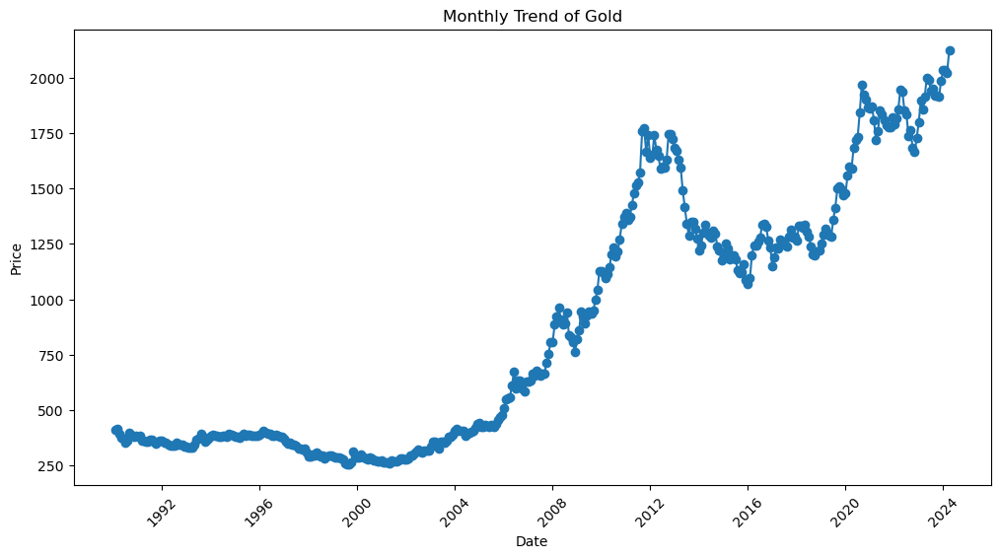

In [ ]:
# Aggregating data by Month for plotting
monthly_data = gold_df.resample('M', on='DATE').mean()  # Monthly average
# If your data doesn't have a specific value to aggregate, you might count the number of records instead.

plt.figure(figsize=(12, 6))
plt.plot(monthly_data.index, monthly_data['USD'], marker='o', linestyle='-')
plt.title('Monthly Trend of Gold')
plt.xlabel('Date')
plt.ylabel('Price')
plt.xticks(rotation=45)
plt.show()


1. **Long-Term Trend**: The long-term trend on the graph indicates a significant increase in the price of gold from 1990 onwards. The initial prices are around $350 per ounce, and there is a general upward trend peaking at around $2000 per ounce by 2020.

2. **Key Phases of the Trend**:

   - **Stable Early 1990s**: From 1990 until the early 2000s, the price of gold was relatively stable, fluctuating mildly around 350 dolllars to 450 dollars per ounce.
   - **Rapid Increase Post-2000**: There's a sharp increase starting around the early 2000s, which continues until about 2011-2012, peaking close to 1900 dollars. This period likely reflects increased investment during times of economic uncertainty, such as the 2008 financial crisis.
   
   - **Drop and Recovery (2012-2015):** After reaching a peak, the prices dropped to about 1100 dollars by 2015, followed by a recovery and fluctuations that show an overall upward trend.
   - **Recent High Volatility**: From 2016 onwards, the chart shows more pronounced volatility with several sharp increases and corrections, yet the general direction remains upwards.

3. **Recent Trends**: The most recent data points indicate a resurgence in gold prices, climbing towards and above the $2000 mark. This rise could be associated with ongoing global economic uncertainties, including the impacts of the COVID-19 pandemic, which typically drive investors towards safe-haven assets like gold.

## 4. Dow Jones Industrial dataset (dji_df)

We start with the Dow Jones Industriual Average from Yahoo Finance

In [ ]:
dji_df

,Date,Open,High,Low,Close,Adj Close,Volume
0,1992-01-02,3152.100098,3172.629883,3139.310059,3172.399902,3172.399902,23550000
1,1992-01-03,3172.399902,3210.639893,3165.919922,3201.500000,3201.500000,23620000
2,1992-01-06,3201.500000,3213.330078,3191.860107,3200.100098,3200.100098,27280000
3,1992-01-07,3200.100098,3210.199951,3184.479980,3204.800049,3204.800049,25510000
4,1992-01-08,3204.800049,3229.199951,3185.820068,3203.899902,3203.899902,29040000
...,...,...,...,...,...,...,...
8054,2023-12-22,37349.269531,37534.519531,37268.878906,37385.968750,37385.968750,252970000
8055,2023-12-26,37405.898438,37617.988281,37371.828125,37545.328125,37545.328125,212420000
8056,2023-12-27,37518.621094,37683.699219,37488.601562,37656.519531,37656.519531,245530000
8057,2023-12-28,37661.519531,37778.851562,37650.980469,37710.101562,37710.101562,199550000


The dataset contains 8059 observations and 7 variables, which are:
- the date of observation
- the opening value
- the highest value
- the lowest value
- the closing value
- the adjusted closing value
- the volume

In [ ]:
dji_df.describe()

,Open,High,Low,Close,Adj Close,Volume
count,8059.000000,8059.000000,8059.000000,8059.000000,8059.000000,8.059000e+03
mean,14239.732870,14324.489790,14152.001482,14243.031445,14243.031445,1.928007e+08
std,8755.858350,8799.763926,8709.691598,8756.713612,8756.713612,1.310664e+08
min,3136.600098,3172.629883,3095.790039,3136.600098,3136.600098,8.410000e+06
25%,8769.975098,8852.615234,8675.220215,8772.290039,8772.290039,7.983000e+07
50%,11052.570312,11136.610352,10981.889648,11055.639648,11055.639648,1.911700e+08
75%,17844.799805,17921.584961,17760.129883,17848.355469,17848.355469,2.775650e+08
max,37701.628906,37778.851562,37650.980469,37710.101562,37710.101562,9.159900e+08


- **Mean**: On average, the Open and Close prices are around 14239, High is approximately 14324, Low is near 14152, the Adjusted Close is around 14243, and the Volume mean is roughly 192800000.
- **Standard Deviation (std)**: Shows high volatility with values over 8000 for price data and 1.31066e+08 for Volume.
- **Minimum (min)**: The lowest recorded value for Open, High, Low, and Close is around 3136, whereas for Volume it's 8.41000e+06.
- **25th Percentile**: Suggests that 25% of the data is below approximately 8769 for price data and 7.98300e+07 for Volume.
- **Median (50%)**: The middle value of the dataset, with the median prices around 11052 and Volume at 1.91170e+08.
- **75th Percentile**: Indicates that 75% of the data is below approximately 17844 for prices and 2.77565e+08 for Volume.
- **Maximum (max)**: The highest values observed are around 37701 for the prices and 9.15990e+08 for Volume.

The table is useful for getting a quick overview of the range, central tendency, and dispersion of financial data over a period of time.

In [ ]:
dji_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8059 entries, 0 to 8058
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       8059 non-null   object 
 1   Open       8059 non-null   float64
 2   High       8059 non-null   float64
 3   Low        8059 non-null   float64
 4   Close      8059 non-null   float64
 5   Adj Close  8059 non-null   float64
 6   Volume     8059 non-null   int64  
dtypes: float64(5), int64(1), object(1)
memory usage: 440.9+ KB


There are no missing values, and we observe that the date is not in the correct format; we need to change it to a date data type.

In [ ]:
dji_df['Date'] = pd.to_datetime(dji_df['Date'])
dji_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8059 entries, 0 to 8058
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   Date       8059 non-null   datetime64[ns]
 1   Open       8059 non-null   float64       
 2   High       8059 non-null   float64       
 3   Low        8059 non-null   float64       
 4   Close      8059 non-null   float64       
 5   Adj Close  8059 non-null   float64       
 6   Volume     8059 non-null   int64         
dtypes: datetime64[ns](1), float64(5), int64(1)
memory usage: 440.9 KB


Now that we have all the variables in the right format, we are going to take a closer look at the different variables.

**1. Time Frame**

In [ ]:
start_date = dji_df['Date'].min()
end_date = dji_df['Date'].max()

print(f"Start date: {start_date}")
print(f"End date: {end_date}")


Start date: 1992-01-02 00:00:00
End date: 2023-12-29 00:00:00


This dataset includes observations starting on January 2, 1992, and ending on December 29, 2023.

**2. Granularity**

In [ ]:
# Display the first 5 dates to infer the frequency
print(dji_df['Date'].head())

0   1992-01-02
1   1992-01-03
2   1992-01-06
3   1992-01-07
4   1992-01-08
Name: Date, dtype: datetime64[ns]


The granularity is every day even if there is lack of values. Will check the lack of valiues later

**3. Extracting Date Components**

We extracting the date compents so we can do futher analysis on the dataset.

In [ ]:
# Extract Year, Month, Day, and Day of Week
dji_df['Year'] = dji_df['Date'].dt.year
dji_df['Month'] = dji_df['Date'].dt.month
dji_df['Day'] = dji_df['Date'].dt.day
dji_df['DayOfWeek'] = dji_df['Date'].dt.dayofweek  # Monday=0, Sunday=6

# Get the month name and weekday name for more intuitive analysis
dji_df['MonthName'] = dji_df['Date'].dt.month_name()
dji_df['DayOfWeekName'] = dji_df['Date'].dt.day_name()

# Display the first few rows to verify
dji_df.head(15)


,Date,Open,High,Low,Close,Adj Close,Volume,Year,Month,Day,DayOfWeek,MonthName,DayOfWeekName
0,1992-01-02,3152.100098,3172.629883,3139.310059,3172.399902,3172.399902,23550000,1992,1,2,3,January,Thursday
1,1992-01-03,3172.399902,3210.639893,3165.919922,3201.500000,3201.500000,23620000,1992,1,3,4,January,Friday
2,1992-01-06,3201.500000,3213.330078,3191.860107,3200.100098,3200.100098,27280000,1992,1,6,0,January,Monday
3,1992-01-07,3200.100098,3210.199951,3184.479980,3204.800049,3204.800049,25510000,1992,1,7,1,January,Tuesday
4,1992-01-08,3204.800049,3229.199951,3185.820068,3203.899902,3203.899902,29040000,1992,1,8,2,January,Wednesday
5,1992-01-09,3203.899902,3228.310059,3192.750000,3209.500000,3209.500000,29820000,1992,1,9,3,January,Thursday
6,1992-01-10,3209.500000,3217.129883,3185.379883,3199.500000,3199.500000,23440000,1992,1,10,4,January,Friday
7,1992-01-13,3199.500000,3201.250000,3179.110107,3185.600098,3185.600098,19300000,1992,1,13,0,January,Monday
8,1992-01-14,3185.600098,3248.879883,3182.919922,3246.199951,3246.199951,24220000,1992,1,14,1,January,Tuesday
9,1992-01-15,3246.199951,3263.419922,3232.110107,3258.500000,3258.500000,29560000,1992,1,15,2,January,Wednesday


**4. Distribution Analysis**

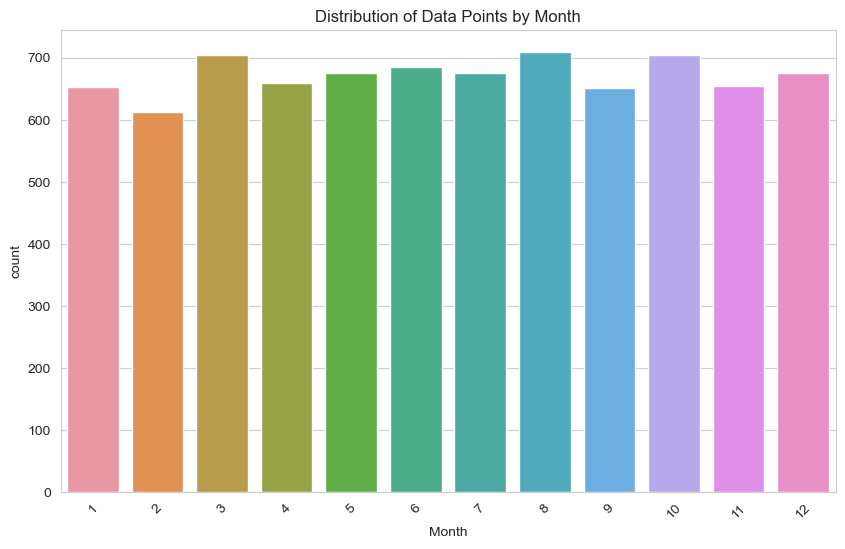

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the aesthetic style of the plots
sns.set_style("whitegrid")

# Plot the distribution of data points by Month
plt.figure(figsize=(10, 6))
sns.countplot(x='Month', data=dji_df)
plt.title('Distribution of Data Points by Month')
plt.xticks(rotation=45)
plt.show()


**Monthly Distribution:**
The second chart represents the count of data points per month, numbered from 1 to 12, likely corresponding to January through December. The distribution is quite uniform, which suggests that the data collection or event occurrences are consistent throughout the year. There is no evident seasonal trend or bias towards any particular month. This uniformity allows for comparability between months without the need to adjust for differing data point counts.

In summary, the two charts collectively suggest a well-maintained dataset with consistent data points across years and months, ideal for time series analysis without the need for complex data normalization or handling of missing data.

**5. Trend analysis**

We are going to use the resample('M', on='Date') function, which is a powerful feature in pandas used for time series data.
Here’s what each argument means:
- 'M': This is a frequency alias in pandas, representing 'end of the month'. By using this, you're telling pandas to group the data into monthly bins. The data within each month will be aggregated (summarized) according to some function, which in this case will be the mean.
- on='Date': This tells pandas which column in the DataFrame to use for determining the bins. The 'Date' column is expected to contain datetime-like values which pandas can recognize and group by month.

/var/folders/bd/m20456f15v78nrrldmd72cph0000gn/T/ipykernel_63300/1582275969.py:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  monthly_data = dji_df.resample('M', on='Date').mean()  # Monthly average


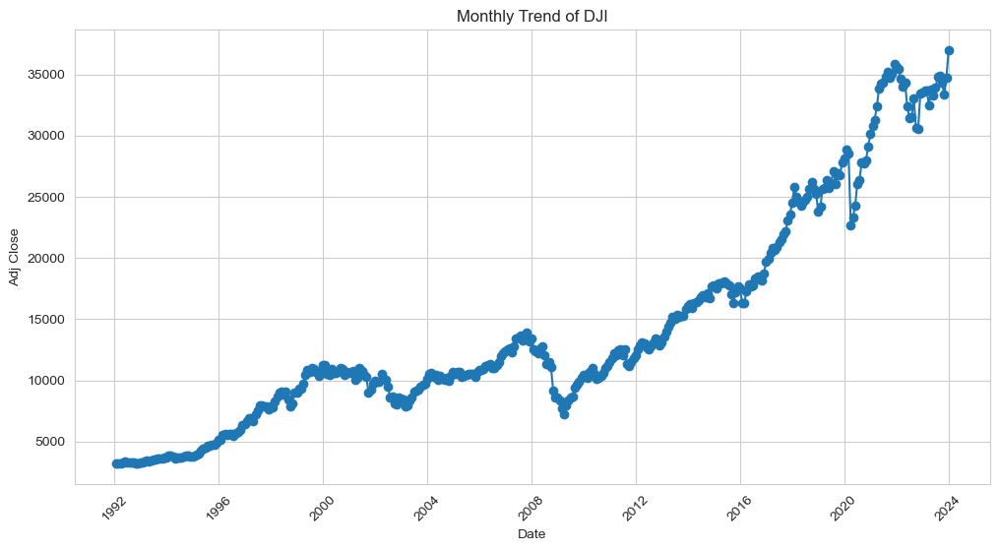

In [ ]:
# Aggregating data by Month for plotting
monthly_data = dji_df.resample('M', on='Date').mean()  # Monthly average
# If your data doesn't have a specific value to aggregate, you might count the number of records instead.

plt.figure(figsize=(12, 6))
plt.plot(monthly_data.index, monthly_data['Adj Close'], marker='o', linestyle='-')
plt.title('Monthly Trend of DJI')
plt.xlabel('Date')
plt.ylabel('Adj Close')
plt.xticks(rotation=45)
plt.show()


**6. Null rate & duplicates**

Then we check the null rate and the duplicates to check if we need to impute data or delete observations.

In [ ]:
# finding Null Rate
null_rate = dji_df.isna().mean().round(4) * 100
null_rate_df = null_rate.to_frame(name='null_rate (%)')
null_rate_df

,null_rate (%)
Date,0.0
Open,0.0
High,0.0
Low,0.0
Close,0.0
Adj Close,0.0
Volume,0.0
Year,0.0
Month,0.0
Day,0.0


Nothing to report.

In [ ]:
# Check for duplicates
duplicates = dji_df.duplicated()

# Check if there are any duplicates
has_duplicates = duplicates.any()

# Count the number of duplicate rows
number_of_duplicates = duplicates.sum()

# Calculate the rate of duplicate rows
rate_of_duplicates = number_of_duplicates / len(dji_df)

print("Are there any duplicate rows?", has_duplicates)
print("Number of duplicate rows:", number_of_duplicates)
print("Rate of duplicate rows:", rate_of_duplicates)

# If you also want to see the duplicate rows
if has_duplicates:
    print("\nDuplicate rows:")
    print(df[duplicates])
else:
    print("\nNo duplicate rows found.")

Are there any duplicate rows? False
Number of duplicate rows: 0
Rate of duplicate rows: 0.0

No duplicate rows found.


## 5. Standar and poor's 500 (sp500_df)

Because the dataframe is from the same source and have the same variable as the prevous one (dji_df), we are using the same code to analyse the dataframe.

In [ ]:
df_eda = sp500_df
df_eda

,Date,Open,High,Low,Close,Adj Close,Volume
0,1990-01-02,353.399994,359.690002,351.980011,359.690002,359.690002,162070000
1,1990-01-03,359.690002,360.589996,357.890015,358.760010,358.760010,192330000
2,1990-01-04,358.760010,358.760010,352.890015,355.670013,355.670013,177000000
3,1990-01-05,355.670013,355.670013,351.350006,352.200012,352.200012,158530000
4,1990-01-08,352.200012,354.239990,350.540009,353.790009,353.790009,140110000
...,...,...,...,...,...,...,...
8560,2023-12-22,4753.919922,4772.939941,4736.770020,4754.629883,4754.629883,3046770000
8561,2023-12-26,4758.859863,4784.720215,4758.450195,4774.750000,4774.750000,2513910000
8562,2023-12-27,4773.450195,4785.390137,4768.899902,4781.580078,4781.580078,2748450000
8563,2023-12-28,4786.439941,4793.299805,4780.979980,4783.350098,4783.350098,2698860000


The dataset contains 8565 observations and 7 variables, which are:
- the date of observation
- the opening value
- the highest value
- the lowest value
- the closing value
- the adjusted closing value
- the volume

In [ ]:
df_eda.describe()

,Open,High,Low,Close,Adj Close,Volume
count,8565.000000,8565.000000,8565.000000,8565.000000,8565.000000,8.565000e+03
mean,1583.568097,1592.942337,1573.574951,1583.898693,1583.898693,2.459029e+09
std,1089.338157,1095.204538,1083.145746,1089.516200,1089.516200,1.849476e+09
min,295.450012,301.450012,294.510010,295.459991,295.459991,1.499000e+07
25%,894.739990,905.840027,883.020020,896.140015,896.140015,6.428000e+08
50%,1267.930054,1275.800049,1259.869995,1267.650024,1267.650024,2.494590e+09
75%,2048.639893,2061.229980,2041.099976,2049.800049,2049.800049,3.831020e+09
max,4804.509766,4818.620117,4780.979980,4796.560059,4796.560059,1.145623e+10


1. **Count**: All columns have 8565 entries, which suggests there are no missing values in this dataset.

2. **Mean**: The average opening price (`Open`) of the stock is approximately 1583.57, while the average closing price (`Close`) is about 1583.89.

3. **Std (Standard Deviation)**: All the price-related columns have a similar standard deviation of around 1080 to 1095, indicating similar variability in open, high, low, and close prices.

4. **Min**: The minimum recorded `Low` price in the dataset is approximately 294.51.

5. **25% (First Quartile)**: The `High` prices, the first quartile is about 905.84, indicating that 25% of the high prices are below this value.

6. **50% (Median)**: Te `Close` prices, the median is approximately 1267.65, meaning that half of the closing prices are below this value and half are above.

7. **75% (Third Quartile)**: For `Adj Close`, the third quartile is approximately 2049.80.

8. **Max**: The maximum `High` price is about 4818.62.

Additionally, the `Volume` column is significantly larger in magnitude than the price columns, which is typical because volume is counted in shares and can reach into the millions, while stock prices are typically less than a few thousand.

In [ ]:
df_eda.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8565 entries, 0 to 8564
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       8565 non-null   object 
 1   Open       8565 non-null   float64
 2   High       8565 non-null   float64
 3   Low        8565 non-null   float64
 4   Close      8565 non-null   float64
 5   Adj Close  8565 non-null   float64
 6   Volume     8565 non-null   int64  
dtypes: float64(5), int64(1), object(1)
memory usage: 468.5+ KB


There are no missing values, and we observe that the date is not in the correct format; we need to change it to a date data type.

In [ ]:
#### Date
df_eda['Date'] = pd.to_datetime(df_eda['Date'])
df_eda.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8565 entries, 0 to 8564
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   Date       8565 non-null   datetime64[ns]
 1   Open       8565 non-null   float64       
 2   High       8565 non-null   float64       
 3   Low        8565 non-null   float64       
 4   Close      8565 non-null   float64       
 5   Adj Close  8565 non-null   float64       
 6   Volume     8565 non-null   int64         
dtypes: datetime64[ns](1), float64(5), int64(1)
memory usage: 468.5 KB


Now that we have all the variables in the right format, we are going to take a closer look at the different variables.

**1. Time frame**

In [ ]:
start_date = df_eda['Date'].min()
end_date = df_eda['Date'].max()

print(f"Start date: {start_date}")
print(f"End date: {end_date}")

# Display the first 5 dates to infer the frequency
print(df_eda['Date'].head())

Start date: 1990-01-02 00:00:00
End date: 2023-12-29 00:00:00
0   1990-01-02
1   1990-01-03
2   1990-01-04
3   1990-01-05
4   1990-01-08
Name: Date, dtype: datetime64[ns]


This dataset includes observations starting on January 2, 1992, and ending on December 29, 2023.

The granularity is daily.

**2. Extracting Date Components**

We extracting the date compents so we can do futher analysis on the dataset.

In [ ]:
# Extract Year, Month, Day, and Day of Week
df_eda['Year'] = df_eda['Date'].dt.year
df_eda['Month'] = df_eda['Date'].dt.month
df_eda['Day'] = df_eda['Date'].dt.day
df_eda['DayOfWeek'] = df_eda['Date'].dt.dayofweek  # Monday=0, Sunday=6

# Get the month name and weekday name for more intuitive analysis
df_eda['MonthName'] = df_eda['Date'].dt.month_name()
df_eda['DayOfWeekName'] = df_eda['Date'].dt.day_name()

# Display the first few rows to verify
df_eda.head(15)



,Date,Open,High,Low,Close,Adj Close,Volume,Year,Month,Day,DayOfWeek,MonthName,DayOfWeekName
0,1990-01-02,353.399994,359.690002,351.980011,359.690002,359.690002,162070000,1990,1,2,1,January,Tuesday
1,1990-01-03,359.690002,360.589996,357.890015,358.760010,358.760010,192330000,1990,1,3,2,January,Wednesday
2,1990-01-04,358.760010,358.760010,352.890015,355.670013,355.670013,177000000,1990,1,4,3,January,Thursday
3,1990-01-05,355.670013,355.670013,351.350006,352.200012,352.200012,158530000,1990,1,5,4,January,Friday
4,1990-01-08,352.200012,354.239990,350.540009,353.790009,353.790009,140110000,1990,1,8,0,January,Monday
5,1990-01-09,353.829987,354.170013,349.609985,349.619995,349.619995,155210000,1990,1,9,1,January,Tuesday
6,1990-01-10,349.619995,349.619995,344.320007,347.309998,347.309998,175990000,1990,1,10,2,January,Wednesday
7,1990-01-11,347.309998,350.140015,347.309998,348.529999,348.529999,154390000,1990,1,11,3,January,Thursday
8,1990-01-12,348.529999,348.529999,339.489990,339.929993,339.929993,183880000,1990,1,12,4,January,Friday
9,1990-01-15,339.929993,339.940002,336.570007,337.000000,337.000000,140590000,1990,1,15,0,January,Monday


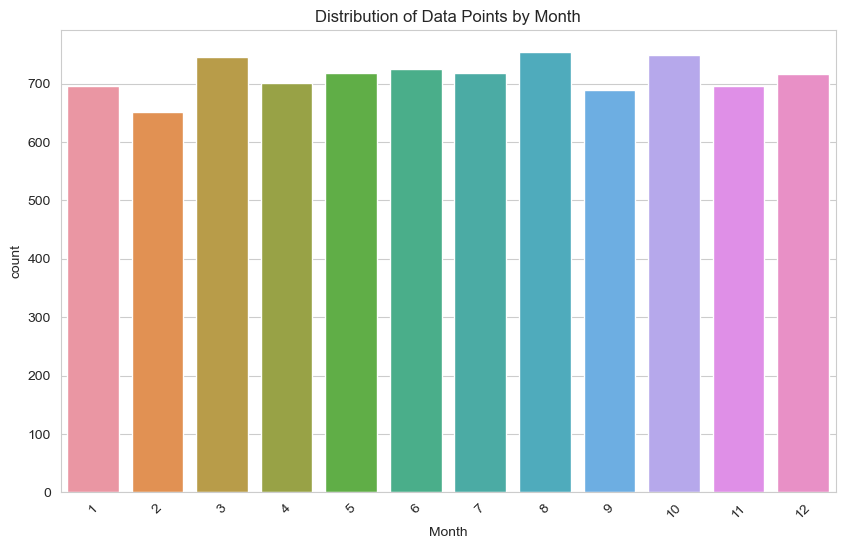

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the aesthetic style of the plots
sns.set_style("whitegrid")

# Plot the distribution of data points by Month
plt.figure(figsize=(10, 6))
sns.countplot(x='Month', data=df_eda)
plt.title('Distribution of Data Points by Month')
plt.xticks(rotation=45)
plt.show()



As for the dji_df, the distribution across the years seems fairly consistent, implying a stable frequency of data collection or occurrence of events annually
The second chart represents the count of data points per month, numbered from 1 to 12, likely corresponding to January through December. The distribution is quite uniform, which suggests that the data collection or event occurrences are consistent throughout the year. There is no evident seasonal trend or bias towards any particular month. This uniformity allows for comparability between months without the need to adjust for differing data point counts.
The dataset has been maintained with a uniform data collection approach both annually and monthly over an extended period. This indicates a reliable and systematic method of recording, which is crucial for any longitudinal analysis.

**This may be deleted:**

/var/folders/bd/m20456f15v78nrrldmd72cph0000gn/T/ipykernel_63300/3356917197.py:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  monthly_data = df_eda.resample('M', on='Date').mean()  # Monthly average


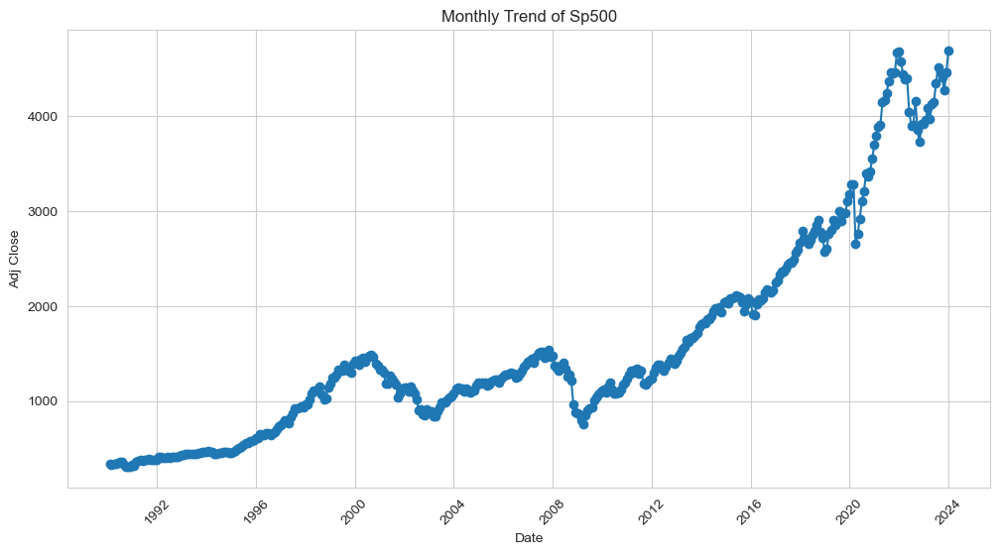

In [ ]:
# Aggregating data by Month for plotting
monthly_data = df_eda.resample('M', on='Date').mean()  # Monthly average
# If your data doesn't have a specific value to aggregate, you might count the number of records instead.

plt.figure(figsize=(12, 6))
plt.plot(monthly_data.index, monthly_data['Adj Close'], marker='o', linestyle='-')
plt.title('Monthly Trend of Sp500')
plt.xlabel('Date')
plt.ylabel('Adj Close')
plt.xticks(rotation=45)
plt.show()

**3. Null rate & duplicates**

Then we check the null rate and the duplicates to check if we need to impute data or delete observations.

In [ ]:
# Finding Null Rate
null_rate = df_eda.isna().mean().round(4) * 100
null_rate_df = null_rate.to_frame(name='null_rate (%)')
null_rate_df


,null_rate (%)
Date,0.0
Open,0.0
High,0.0
Low,0.0
Close,0.0
Adj Close,0.0
Volume,0.0
Year,0.0
Month,0.0
Day,0.0


In [ ]:
# Dropping duplicate values

# Check for duplicates
duplicates = df_eda.duplicated()

# Check if there are any duplicates
has_duplicates = duplicates.any()

# Count the number of duplicate rows
number_of_duplicates = duplicates.sum()

# Calculate the rate of duplicate rows
rate_of_duplicates = number_of_duplicates / len(df_eda)

print("Are there any duplicate rows?", has_duplicates)
print("Number of duplicate rows:", number_of_duplicates)
print("Rate of duplicate rows:", rate_of_duplicates)

# If you also want to see the duplicate rows
if has_duplicates:
    print("\nDuplicate rows:")
    print(df_eda[duplicates])
else:
    print("\nNo duplicate rows found.")


Are there any duplicate rows? False
Number of duplicate rows: 0
Rate of duplicate rows: 0.0

No duplicate rows found.


Nothing to report.

## 6. Nasdaq (nasdaq_df)

As the previous ones (dji_df and sp500_df), we are using the same code to analyse the dataframe.

In [ ]:
df_eda = nasdaq_df
df_eda

,Date,Open,High,Low,Close,Adj Close,Volume
0,1990-01-02,452.899994,459.299988,452.700012,459.299988,459.299988,110720000
1,1990-01-03,461.100006,461.600006,460.000000,460.899994,460.899994,152660000
2,1990-01-04,460.399994,460.799988,456.899994,459.399994,459.399994,147950000
3,1990-01-05,457.899994,459.399994,457.799988,458.200012,458.200012,137230000
4,1990-01-08,457.100006,458.700012,456.500000,458.700012,458.700012,115500000
...,...,...,...,...,...,...,...
8560,2023-12-22,15006.179688,15047.190430,14927.120117,14992.969727,14992.969727,4796600000
8561,2023-12-26,15028.690430,15101.179688,15024.059570,15074.570312,15074.570312,6120600000
8562,2023-12-27,15089.660156,15114.080078,15051.669922,15099.179688,15099.179688,7480170000
8563,2023-12-28,15142.089844,15150.070312,15087.219727,15095.139648,15095.139648,5090570000


The dataset contains 8565 observations and the same 7 variables.

In [ ]:
df_eda.describe()

,Open,High,Low,Close,Adj Close,Volume
count,8565.000000,8565.000000,8565.000000,8565.000000,8565.000000,8.565000e+03
mean,3825.029745,3852.040011,3794.527527,3824.976858,3824.976858,1.825741e+09
std,3699.127109,3725.408378,3670.109337,3699.559441,3699.559441,1.359532e+09
min,325.100006,327.899994,323.000000,325.399994,325.399994,4.421000e+07
25%,1465.770020,1486.939941,1444.420044,1466.160034,1466.160034,7.678900e+08
50%,2354.070068,2371.649902,2331.570068,2349.000000,2349.000000,1.770880e+09
75%,4809.689941,4846.740234,4786.009766,4821.660156,4821.660156,2.162250e+09
max,16120.919922,16212.230469,16017.230469,16057.440430,16057.440430,1.162119e+10


1. **Count**: All columns have 8565 entries, which suggests there are no missing values in this dataset.

2. **Mean**: The average opening price (`Open`) of the stock is approximately 3825 as for the close.

3. **Std (Standard Deviation)**: All the price-related columns have a similar standard deviation of around 1080 to 1095, indicating similar variability in open, high, low, and close prices.

4. **Min**: The minimum recorded `Low` price in the dataset is approximately 294.51.

5. **25% (First Quartile)**: The `High` prices, the first quartile is about 905.84, indicating that 25% of the high prices are below this value.

6. **50% (Median)**: Te `Close` prices, the median is approximately 1267.65, meaning that half of the closing prices are below this value and half are above.

7. **75% (Third Quartile)**: For `Adj Close`, the third quartile is approximately 2049.80.

8. **Max**: The maximum `High` price is about 4818.62.

Additionally, the `Volume` column is significantly larger in magnitude than the price columns, which is typical because volume is counted in shares and can reach into the millions, while stock prices are typically less than a few thousand.

In [ ]:
df_eda.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8565 entries, 0 to 8564
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       8565 non-null   object 
 1   Open       8565 non-null   float64
 2   High       8565 non-null   float64
 3   Low        8565 non-null   float64
 4   Close      8565 non-null   float64
 5   Adj Close  8565 non-null   float64
 6   Volume     8565 non-null   int64  
dtypes: float64(5), int64(1), object(1)
memory usage: 468.5+ KB


There are no missing values, and we convert the date variable

In [ ]:
#### Date
df_eda['Date'] = pd.to_datetime(df_eda['Date'])
df_eda.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8565 entries, 0 to 8564
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   Date       8565 non-null   datetime64[ns]
 1   Open       8565 non-null   float64       
 2   High       8565 non-null   float64       
 3   Low        8565 non-null   float64       
 4   Close      8565 non-null   float64       
 5   Adj Close  8565 non-null   float64       
 6   Volume     8565 non-null   int64         
dtypes: datetime64[ns](1), float64(5), int64(1)
memory usage: 468.5 KB


**1. Time frame**

In [ ]:
start_date = df_eda['Date'].min()
end_date = df_eda['Date'].max()

print(f"Start date: {start_date}")
print(f"End date: {end_date}")

# Display the first 5 dates to infer the frequency
print(df_eda['Date'].head())

Start date: 1990-01-02 00:00:00
End date: 2023-12-29 00:00:00
0   1990-01-02
1   1990-01-03
2   1990-01-04
3   1990-01-05
4   1990-01-08
Name: Date, dtype: datetime64[ns]


The time frame is tsill the same which is a good thing for our further merging

The granularity is daily.

**2. Extracting Date Components**

In [ ]:
# Extract Year, Month, Day, and Day of Week
df_eda['Year'] = df_eda['Date'].dt.year
df_eda['Month'] = df_eda['Date'].dt.month
df_eda['Day'] = df_eda['Date'].dt.day
df_eda['DayOfWeek'] = df_eda['Date'].dt.dayofweek  # Monday=0, Sunday=6

# Get the month name and weekday name for more intuitive analysis
df_eda['MonthName'] = df_eda['Date'].dt.month_name()
df_eda['DayOfWeekName'] = df_eda['Date'].dt.day_name()

# Display the first few rows to verify
df_eda.head(5)

,Date,Open,High,Low,Close,Adj Close,Volume,Year,Month,Day,DayOfWeek,MonthName,DayOfWeekName
0,1990-01-02,452.899994,459.299988,452.700012,459.299988,459.299988,110720000,1990,1,2,1,January,Tuesday
1,1990-01-03,461.100006,461.600006,460.000000,460.899994,460.899994,152660000,1990,1,3,2,January,Wednesday
2,1990-01-04,460.399994,460.799988,456.899994,459.399994,459.399994,147950000,1990,1,4,3,January,Thursday
3,1990-01-05,457.899994,459.399994,457.799988,458.200012,458.200012,137230000,1990,1,5,4,January,Friday
4,1990-01-08,457.100006,458.700012,456.500000,458.700012,458.700012,115500000,1990,1,8,0,January,Monday


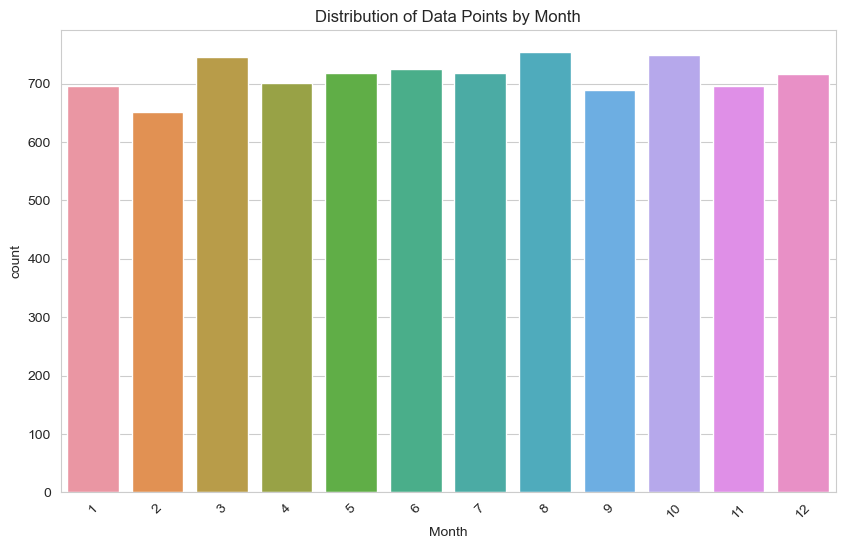

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the aesthetic style of the plots
sns.set_style("whitegrid")

# Plot the distribution of data points by Month
plt.figure(figsize=(10, 6))
sns.countplot(x='Month', data=df_eda)
plt.title('Distribution of Data Points by Month')
plt.xticks(rotation=45)
plt.show()

As for the previous dataframe, there are no gaps between year or mounths.

/var/folders/bd/m20456f15v78nrrldmd72cph0000gn/T/ipykernel_63300/3016068159.py:4: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  monthly_data = df_eda.resample('M', on='Date').mean()  # Monthly average


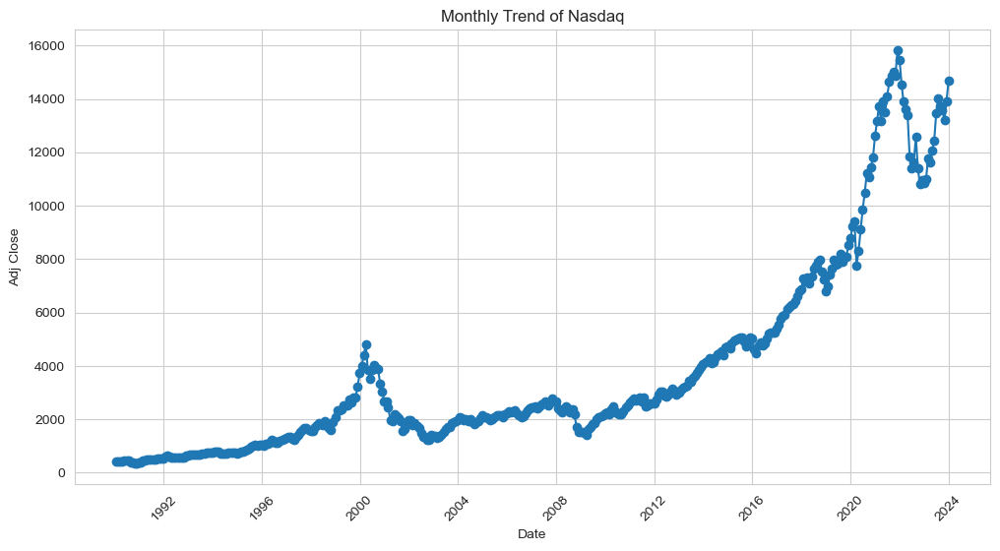

In [ ]:
#**This may be deleted:**

# Aggregating data by Month for plotting
monthly_data = df_eda.resample('M', on='Date').mean()  # Monthly average
# If your data doesn't have a specific value to aggregate, you might count the number of records instead.

plt.figure(figsize=(12, 6))
plt.plot(monthly_data.index, monthly_data['Adj Close'], marker='o', linestyle='-')
plt.title('Monthly Trend of Nasdaq')
plt.xlabel('Date')
plt.ylabel('Adj Close')
plt.xticks(rotation=45)
plt.show()

**3. Null rate & duplicates**

Then we check the null rate and the duplicates to check if we need to impute data or delete observations.


In [ ]:
# Finding Null Rate
null_rate = df_eda.isna().mean().round(4) * 100
null_rate_df = null_rate.to_frame(name='null_rate (%)')
null_rate_df

,null_rate (%)
Date,0.0
Open,0.0
High,0.0
Low,0.0
Close,0.0
Adj Close,0.0
Volume,0.0
Year,0.0
Month,0.0
Day,0.0


In [ ]:
# Dropping duplicate values

# Check for duplicates
duplicates = df_eda.duplicated()

# Check if there are any duplicates
has_duplicates = duplicates.any()

# Count the number of duplicate rows
number_of_duplicates = duplicates.sum()

# Calculate the rate of duplicate rows
rate_of_duplicates = number_of_duplicates / len(df_eda)

print("Are there any duplicate rows?", has_duplicates)
print("Number of duplicate rows:", number_of_duplicates)
print("Rate of duplicate rows:", rate_of_duplicates)

# If you also want to see the duplicate rows
if has_duplicates:
    print("\nDuplicate rows:")
    print(df_eda[duplicates])
else:
    print("\nNo duplicate rows found.")



Are there any duplicate rows? False
Number of duplicate rows: 0
Rate of duplicate rows: 0.0

No duplicate rows found.


Nothing to report.

# III. Data Preparation

More data is needed to optimally train predictive models than 761 rows of information.
Daily prices on selected commodities were collected using Bloomberg's extensive databases available through their terminals available at Yeshiva University.

Daily market movers data is easily merged with the daily commodities prices on the date. However, the economic data selected is measured on a monthly timeline. Therefore, the consumer price index will be casted throughout all the days of each month.

In [ ]:
#dataset that contains commodities and market factors
df = pd.read_csv('https://raw.githubusercontent.com/Benhamax/final-project/main/comsprice.csv')
df['date'] = pd.to_datetime(df['date'])
df = df[df['date'] < '03-02-2023']

#Since
columns_to_keep = ['Month', 'USA_CPI', 'AUT_CPI', 'CAN_CPI', 'SA_CPI', 'UK_CPI', 'SUI_CPI',
       'FRA_CPI', 'GER_CPI', 'IL_CPI', 'ITA_CPI', 'PRC_CPI', 'RUS_CPI']

cpi_data = pd.DataFrame(cpi_df[columns_to_keep], columns = columns_to_keep)

cpi_data.rename(columns={'Month': 'date'}, inplace=True)

cpi_data['month'] = cpi_data['date'].dt.to_period('M')
df['month'] = df['date'].dt.to_period('M')

merged_df = df.merge(cpi_data, on=['month'], how='left')
merged_df



,day,date_x,crude,natgas,sugar_us,platinum,silver,gold,DJIA,NASDAQ,...,CAN_CPI,SA_CPI,UK_CPI,SUI_CPI,FRA_CPI,GER_CPI,IL_CPI,ITA_CPI,PRC_CPI,RUS_CPI
0,We,2023-03-01,80.57,6.600000,0.212800,942.71,20.7640,1822.28,34245.93,11891.79,...,122.702,147.586,126.8,106.245,116.79,122.4020,110.2,118.8,132.3,226.285
1,Tu,2023-02-28,81.30,6.970000,0.215800,913.03,21.3085,1825.39,33869.27,11718.12,...,122.070,146.101,126.0,106.082,115.78,121.4530,109.7,119.3,132.7,226.255
2,Mo,2023-02-27,82.06,6.430000,0.212900,951.18,21.5099,1835.09,33699.88,11789.58,...,122.070,146.101,126.0,106.082,115.78,121.4530,109.7,119.3,132.7,226.255
3,Fr,2023-02-24,81.60,6.935000,0.213300,953.59,21.8335,1841.38,33949.01,11910.52,...,122.070,146.101,126.0,106.082,115.78,121.4530,109.7,119.3,132.7,226.255
4,Th,2023-02-23,79.05,6.587000,0.214133,946.88,21.8171,1842.36,34156.69,12113.79,...,122.070,146.101,126.0,106.082,115.78,121.4530,109.7,119.3,132.7,226.255
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8349,Fr,1990-04-20,13.85,1.573833,0.161300,380.75,4.0900,386.30,2691.13,440.46,...,61.200,19.000,54.4,76.200,67.10,62.6284,29.3,51.3,40.7,0.000
8350,Th,1990-04-19,13.90,1.573833,0.159300,380.75,4.0900,390.80,2687.93,436.94,...,61.200,19.000,54.4,76.200,67.10,62.6284,29.3,51.3,40.7,0.000
8351,We,1990-04-18,12.95,1.573833,0.155400,384.75,4.0400,382.80,2695.61,434.35,...,61.200,19.000,54.4,76.200,67.10,62.6284,29.3,51.3,40.7,0.000
8352,Tu,1990-04-17,13.50,1.573833,0.157300,384.75,4.1400,383.75,2697.53,436.03,...,61.200,19.000,54.4,76.200,67.10,62.6284,29.3,51.3,40.7,0.000


In [ ]:
df2 = merged_df

df2.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 8354 entries, 0 to 8353
Data columns (total 25 columns):
 #   Column    Non-Null Count  Dtype         
---  ------    --------------  -----         
 0   day       8354 non-null   object        
 1   date_x    8354 non-null   datetime64[ns]
 2   crude     8354 non-null   float64       
 3   natgas    8354 non-null   float64       
 4   sugar_us  8354 non-null   float64       
 5   platinum  8354 non-null   float64       
 6   silver    8354 non-null   float64       
 7   gold      8354 non-null   float64       
 8   DJIA      8354 non-null   float64       
 9   NASDAQ    8354 non-null   float64       
 10  S&P500    8339 non-null   float64       
 11  month     8354 non-null   period[M]     
 12  date_y    8354 non-null   datetime64[ns]
 13  USA_CPI   8354 non-null   float64       
 14  AUT_CPI   8354 non-null   float64       
 15  CAN_CPI   8354 non-null   float64       
 16  SA_CPI    8354 non-null   float64       
 17  UK_CPI    8354

We can drop date_y and month now that the data is all together. Additionally date_x can be renamed to date

In [ ]:
df2.drop('date_y', axis = 1, inplace = True)

df2.drop('month', axis = 1, inplace = True)

df2.rename(columns={'date_x': 'date'}, inplace=True)

df2['date'] = pd.to_datetime(df2['date'], format = '%m/%d/%Y')

df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8354 entries, 0 to 8353
Data columns (total 23 columns):
 #   Column    Non-Null Count  Dtype         
---  ------    --------------  -----         
 0   day       8354 non-null   object        
 1   date      8354 non-null   datetime64[ns]
 2   crude     8354 non-null   float64       
 3   natgas    8354 non-null   float64       
 4   sugar_us  8354 non-null   float64       
 5   platinum  8354 non-null   float64       
 6   silver    8354 non-null   float64       
 7   gold      8354 non-null   float64       
 8   DJIA      8354 non-null   float64       
 9   NASDAQ    8354 non-null   float64       
 10  S&P500    8339 non-null   float64       
 11  USA_CPI   8354 non-null   float64       
 12  AUT_CPI   8354 non-null   float64       
 13  CAN_CPI   8354 non-null   float64       
 14  SA_CPI    8354 non-null   float64       
 15  UK_CPI    8354 non-null   float64       
 16  SUI_CPI   8354 non-null   float64       
 17  FRA_CPI   8354

There are 15 values missing in the S&P500 column, therefore, KNN imputation will be used to inpute nulls because the best estimate for a missing price would be the average price of the preceding and following days.

In [ ]:
from sklearn.impute import KNNImputer

predictors = [i for i in df2.columns if i not in ['gold', 'day', 'date']]

X = df2[predictors].values
imputer = KNNImputer(n_neighbors=4)
X_imputed = imputer.fit_transform(X)

df2[predictors] = X_imputed
df2.isna().sum().sum()



0

check for duplicates

In [ ]:
df2.duplicated().sum()

0

Data is prepped for review.


# IV. Prepped Data Review

Checking the correlations between the variables.

In [ ]:
corrs = df2[predictors].corr()

<Axes: >

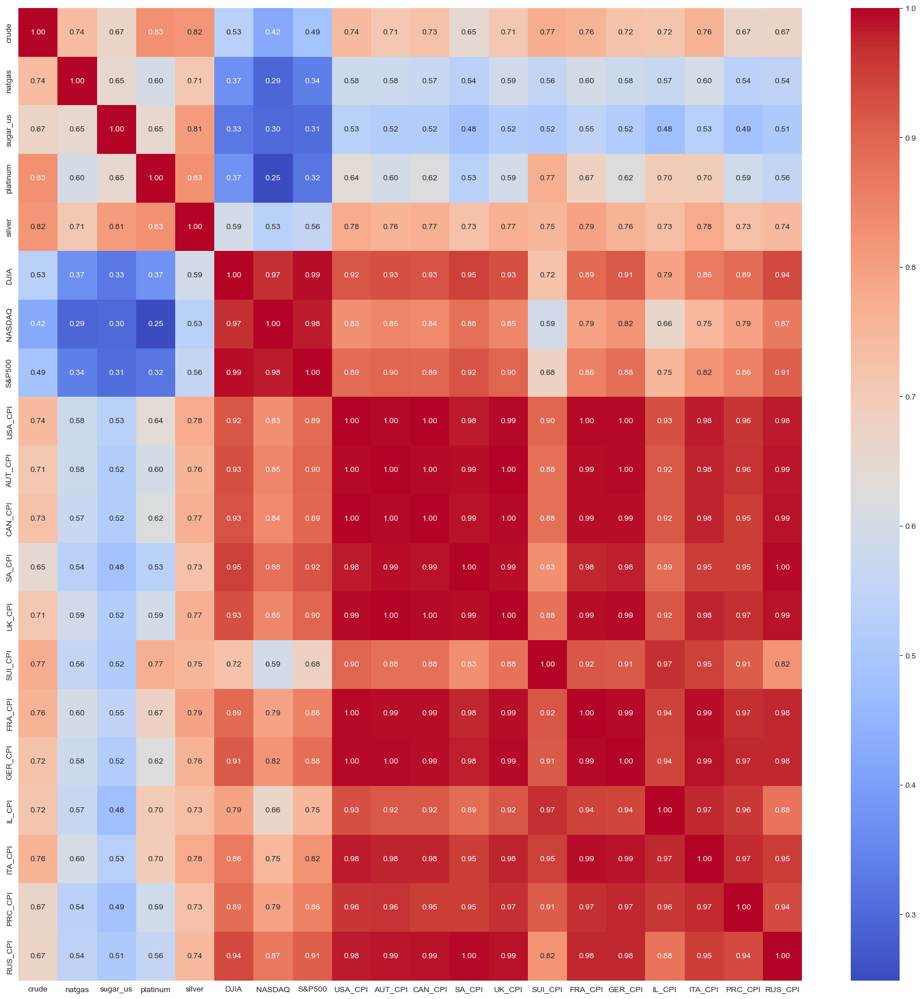

In [ ]:
plt.figure(figsize = (22,22))
sns.heatmap(corrs, annot=True, cmap='coolwarm', fmt = '.2f')

- It appears that the market predictors correlate strongly in the positive direction with the economic predictors.

Adding recession indicator to take times of economic recessions

In [ ]:
df2 = recession_feat(df2.copy(), 'date', 'recession')
df2['recession'].value_counts()

False    7080
True     1274
Name: recession, dtype: int64

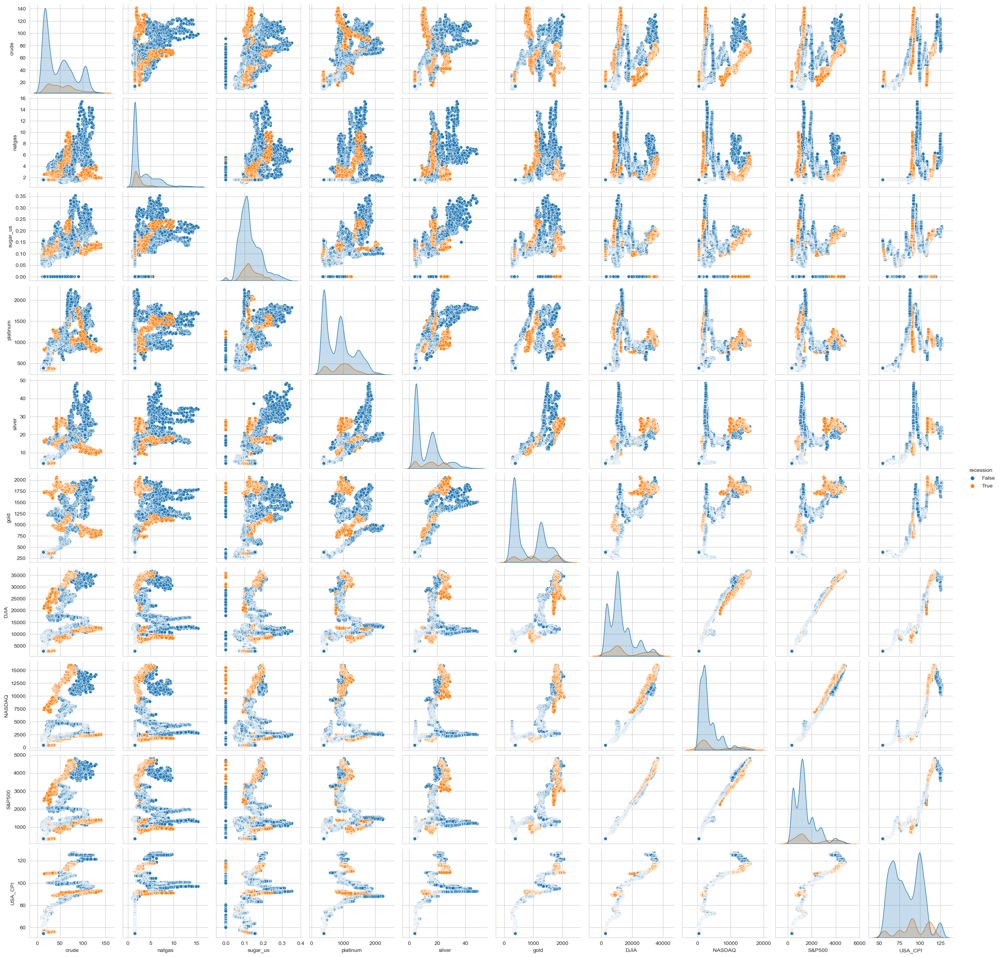

In [ ]:
predictors = ['crude', 'natgas', 'sugar_us', 'platinum', 'silver',
       'gold', 'DJIA', 'NASDAQ', 'S&P500', 'USA_CPI', 'recession']
sns.pairplot(df2[predictors], hue = 'recession')

There are very complex relationships in the data that the models will make generalizations from.

# V. Model Training

Training pre-built predictive models to forecast the spot price of gold in US Dollars given a set of economic and market indicators. **Predictive value will be assessd on average percent difference between actual and predicted outcome (MAPE). A common rule of thumb is setting a materiality threshold of 5 percent**.  

The two best performing models will have parameters optimized to land predictions within a certain range of values

Optimized models will deliver insight on which factors are predictive or significant in gold pricing.

Scikit learn published a library that composes estimators whoch makes baseline modeling quicker. This project will be using a pipeline to fit seven different regressors at once using the following techniques:

1. Linear Regression
2. K-Nearest Neighbor
3. Support Vector Machines
4. Regression Trees
5. Random Forests
6. Gradient Boosting
7. Nueral Netowrk (Multi-Layered Perceptron)

**Approach**

**Split Data into Training, Validating, and Testing**

**- Fit Regression Pipeline**

**- Test Models**

**- Review Model Performance Metrics**




In [ ]:
#installing required packages
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from sklearn.ensemble import StackingRegressor, RandomForestRegressor, GradientBoostingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn import preprocessing as pre
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error, r2_score


In [ ]:
#creating copy dataset to work with
df2_copy = df2.copy()

# use a year's worth of data for the test set
to_split = df2_copy[df2_copy['date'] < '03-02-2022']
to_split.drop('day', axis = 1, inplace = True)
to_split.drop('date', axis = 1, inplace = True)

X = to_split.drop('gold', axis = 1)
y = to_split['gold']

#split data into training and validation sets

X_train, X_validate, y_train, y_validate = train_test_split(X, y, test_size = 0.30, random_state = 42)

#Y test set
y_test_set = df2_copy[df2_copy['date'] > '03-02-2022']
y_test = y_test_set['gold']

#X test set
X_test_set= df2_copy[df2_copy['date'] > '03-02-2022']
X_test = X_test_set[to_split.columns].drop('gold', axis = 1)

models = ["Linear Regression", "KNN", "Support Vector Regressor", "Regression Tree", "Random Forest", "Gradient Boosting", "Neural Net"]
regressors = [
    LinearRegression(),
    KNeighborsRegressor(n_neighbors=5),
    SVR(),
    DecisionTreeRegressor(max_depth=5),
    RandomForestRegressor(max_depth=11, n_estimators=22),
    GradientBoostingRegressor(),
    MLPRegressor(alpha=1, max_iter=1000)
]

for name, reg in zip(models, regressors):
  #need to scale for specific models
    if name == "Neural Net" or "KNN" or name == 'SVR':
        reg_pipe = Pipeline([('scaler', MinMaxScaler(feature_range = (0,1))), (name, reg)])
    else:
        reg_pipe = Pipeline([(name, reg)])

    reg_pipe.fit(X_train, y_train)

    y_pred = reg_pipe.predict(X_test)

    rmse = mean_squared_error(y_test, y_pred, squared=False)

    mape = mean_absolute_percentage_error(y_test, y_pred)

    r2 = r2_score(y_test, y_pred)
    print('Metrics for', name, 'model')
    print('RMSE:', rmse)
    print('MAPE:', mape)
    print('R-squared:', r2)
    print('\n')

/var/folders/bd/m20456f15v78nrrldmd72cph0000gn/T/ipykernel_63300/3464915449.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  to_split.drop('day', axis = 1, inplace = True)
/var/folders/bd/m20456f15v78nrrldmd72cph0000gn/T/ipykernel_63300/3464915449.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  to_split.drop('date', axis = 1, inplace = True)


Metrics for Linear Regression model
RMSE: 157.04305785179295
MAPE: 0.07859628588586104
R-squared: -1.6632906197676154


Metrics for KNN model
RMSE: 117.87874957685284
MAPE: 0.05481256089431937
R-squared: -0.5005556766753116


Metrics for Support Vector Regressor model
RMSE: 621.1247611090922
MAPE: 0.3382899924548723
R-squared: -40.661869950143505


Metrics for Regression Tree model
RMSE: 159.9705793375628
MAPE: 0.07751054798989104
R-squared: -1.7635117069465909


Metrics for Random Forest model
RMSE: 78.41100999329008
MAPE: 0.03542981471588871
R-squared: 0.3360503147783047


Metrics for Gradient Boosting model
RMSE: 71.65885131064955
MAPE: 0.033200637625732186
R-squared: 0.4454754758939199


Metrics for Neural Net model
RMSE: 99.75788271625605
MAPE: 0.0471373089054577
R-squared: -0.07467097496428532




/Users/alonbnh/anaconda3/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Interpretability for these models can get complex, fitting a regression tree will give an idea of which variables are most predictive in the decision making process of the tree based methods used.


**Feature Interpretation Using Tree Based Methods**

At this step of the project a free, pre-built, regression tree will be trained to predict the price of gold given a set of economic factors, market factors, and selected commodities prices. The objective of this technique is to visualize which variables are most relevant in the decision making process.


IndexError: list index out of range

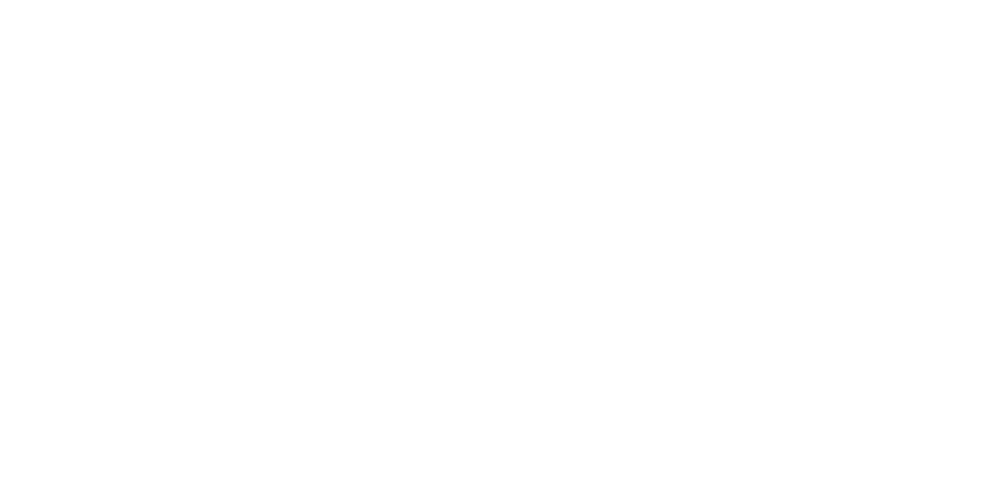

In [ ]:
#fit tree

X_train.rename(columns={'S&P500': 'snp'}, inplace=True)
tree2 = tree.DecisionTreeRegressor(min_samples_leaf = 3, max_depth = 5)

tree2.fit(X_train, y_train)

param_grid = {'max_depth': [3, 5, 7],
              'min_samples_leaf': [3, 5, 7]}

gridsearch = GridSearchCV(estimator = tree2, param_grid = param_grid, cv = 10)

gridsearch.fit(X_train, y_train)

#Get the best parameters
best_params = gridsearch.best_params_

#Fit the model with the best parameters
best_tree = tree.DecisionTreeRegressor(max_depth=best_params['max_depth'], min_samples_leaf=best_params['min_samples_leaf'])
best_tree.fit(X_train, y_train)


# Convert index to list
feature_names = list(X_train.columns)

# Visualize the decision tree
plt.figure(figsize=(20,10))
plot_tree(tree1, feature_names=feature_names, filled=True, rounded=True)
plt.show()

**Top to Bottom Approach**

- The monthly price for a basket of goods in South Africa is the most predictable feature in predicting the price of gold

- Silver is the second most predictable factor in determining the spot price of gold

**Economic factors appear more often higher and earlier in the decision making process than do stock market indicators**

- The focus should shift to the right side of the tree since the current CPI of South Africa is above 70





# VI. Model Selection

Regression Models Scoreboard

**Linear Regression Performance:**
- RMSE: 161.7816
- MAPE: 0.0808
- R-squared: -1.8264

**KNN Model Performance:**
- RMSE: 117.8787
- MAPE: 0.0548
- R-squared: -0.5006

**Support Vector Regressor Performance:**
- RMSE: 611.0165
- MAPE: 0.3330
- R-squared: -39.3169

**Regression Tree Performance:**
- RMSE: 91.5430
- MAPE: 0.0411
- R-squared: 0.0950

**Random Forest Performance:**
- RMSE: 73.5262
- MAPE: 0.0336
- R-squared: 0.4162

**Gradient Boosting Performance:**
- RMSE: 70.5385
- MAPE: 0.0329
- R-squared: 0.4627

**Neural Net Performance:**
- RMSE: 114.4266
- MAPE: 0.0512
- R-squared: -0.4140

The **best performing** baseline models for predicting the spot price of gold are (based on MAPE):

1. **Gradient Boosting**
2. **Regression Tree**

- The gradient boosting regressor performed the best in terms of minimizing the average error rate.
- Random Forest was able to make predictions under 5% error.
- Managed to understand 95% of the variance in unseen data.
- Delivers interpretable insight on feature predictability.

# VII. Ensemble Modeling
At this point the best performing models will be working together in a stacked model. The combined strengths of both models can yield higher predictive performance. Individual model metrics will still be observed; while they are being stacked up with each other they will also be stacked against each other.

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import RepeatedKFold
from numpy import mean, std
scaler = MinMaxScaler(feature_range = (0,1))
X_scaled = scaler.fit_transform(X)


def get_stacking():
    # Define the base models
    level0 = list()
    level0.append(('dt', DecisionTreeRegressor()))
    level0.append(('gb', GradientBoostingRegressor()))
    # Define meta learner model
    level1 = LinearRegression()
    # Define the stacking ensemble
    model = StackingRegressor(estimators=level0, final_estimator=level1, cv=5)
    return model

def evaluate_model(model, X, y):
    cv = RepeatedKFold(n_splits=5, n_repeats=3, random_state=1)
    scores = cross_val_score(model, X, y, scoring='neg_mean_absolute_percent_error', cv=cv, n_jobs=-1, error_score='raise')
    return scores

def get_models2():
    models = dict()
    models['dt'] = DecisionTreeRegressor()
    models['gb'] = GradientBoostingRegressor()
    models['stacking'] = get_stacking()
    return models

models2 = get_models2()

results, names = list(), list()
for name, model in models2.items():
    scores = evaluate_model(model, X_test, y_test) #use the unseen data to test the stacked model
    results.append(scores)
    names.append(name)
    print('>%s %.3f (%.3f)' % (name, mean(scores), std(scores)))

# Plot model performance for comparison
plt.boxplot(results, labels=names, showmeans=True)
plt.show()

NameError: name 'MinMaxScaler' is not defined

- The Gradient boosted regression tree predicts the price of gold the best on its own despite combining its strengths with those of the regression tree.

- Additionally, the regression tree performed better on its own than did the stacked model.

- The stacked model made a wider range of predictions causing the higher average error (almost twice as higher as the gradient boosted regression tree).

# IX. Conclusion

The daily spot price of gold can be predicted within 5% of the actual by contrasting the impact of inflation rates, commodity prices, and stock market fluctuations. Inflationary economic factor are the predictive features in determining gold price than stock market indicators and commodities prices. In fact, the most predictive economic factor in projecting the spot price of gold, according to the tree based methods employed in the project, South Africa's consumer price index is considered first before any other factor. Predicting prices can be taken to the next level by incorporating natural language processing and Reddit's API to measure the influence Redditors have on precious metals prices. Redditor posting trends and certain keywords in subreddits can influence a change public demand. Fast moving information is a variable in the supply and demand equation afterall.

The daily closing price of gold can be predicted with moderate accuracy by analyzing inflation rates, commodity prices, and stock market fluctuations.

Economic factors have the most significant impact on the daily closing price of gold, followed by market conditions and inflation rates.

Inflation in specific countries can influence the daily closing price of gold to some extent, but its impact may vary depending on other factors such as market conditions and commodity prices.